Black Scholes Model  
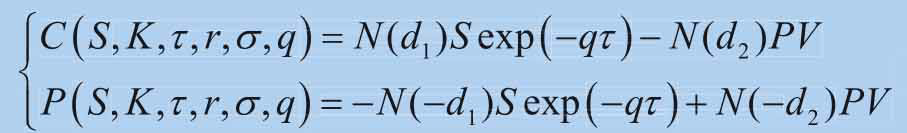  
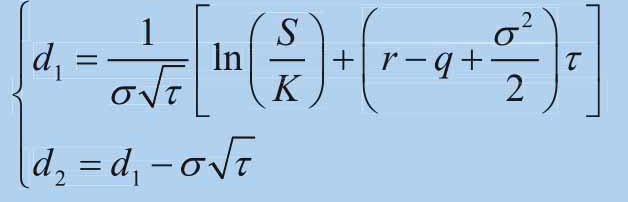  
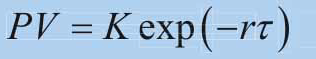  
其中S為價格 K為執行價 T為距到期時間 R為無風險利率 SIGMA為波動率 Q為股利


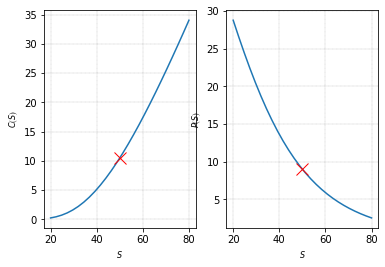

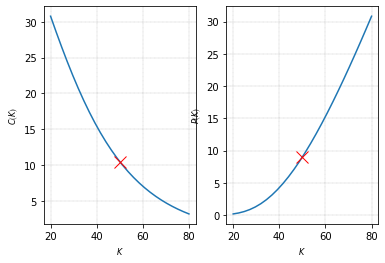

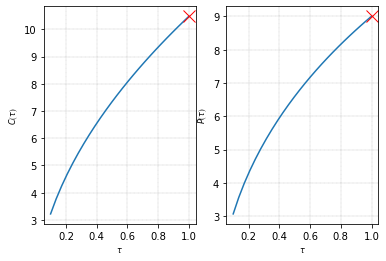

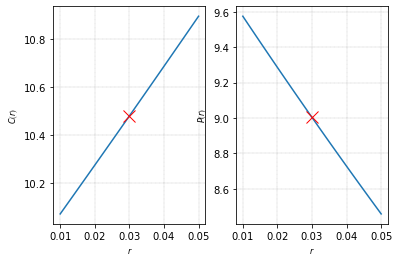

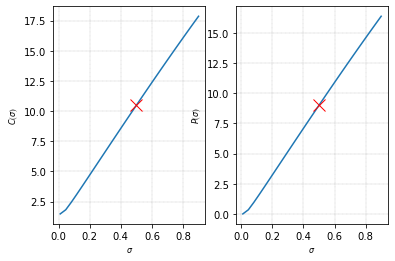

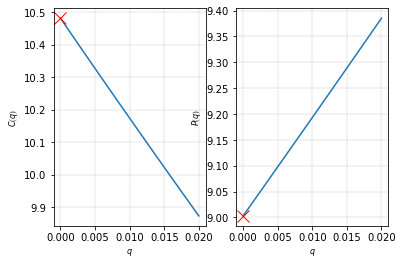

In [1]:
import math
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.stats import norm
from mpl_toolkits.mplot3d import axes3d
import matplotlib.tri as tri
from matplotlib.font_manager import FontProperties

font = FontProperties()
font.set_family('serif')
font.set_name('Times New Roman')
font.set_size(8)

# Delta of European option

def blsprice(St, K, tau, r, vol, q):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r - q + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    
    Call = norm.cdf(d1, loc=0, scale=1)*St*math.exp(-q*tau) - \
        norm.cdf(d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    Put  = -norm.cdf(-d1, loc=0, scale=1)*St*math.exp(-q*tau) + \
        norm.cdf(-d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    return Call, Put

def plot_curve(S_array,Call_array,Put_array,S,Call0,Put0,text):#同時標記call0 put0
    
    fig, axs = plt.subplots(1,2)

    axs[0].plot(S_array, Call_array)
    axs[0].plot(S, Call0,'rx', markersize = 12)
    x_label = '$\it{' + text + '}$'
    axs[0].set_xlabel(x_label, fontname="Times New Roman", fontsize=8)
    y_label = '$\it{C}$($\it{' + text + '}$)'
    axs[0].set_ylabel(y_label, family="Times New Roman", fontsize=8)
    axs[0].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

    axs[1].plot(S_array, Put_array)
    axs[1].plot(S, Put0,'rx', markersize = 12)
    axs[1].set_xlabel(x_label, family="Times New Roman", fontsize=8)
    y_label = '$\it{P}$($\it{' + text + '}$)'
    axs[1].set_ylabel(y_label, fontname="Times New Roman", fontsize=8)
    axs[1].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

# end of function

blsprice_vec = np.vectorize(blsprice)#兩值之array轉vectorize

S = 50;    # spot price
S_array  = np.linspace(20,80,26);

K = 50;    # strike price
K_array  = np.linspace(20,80,26);

r = 0.03;  # risk-free rate
r_array  = np.linspace(0.01,0.05,26);

vol = 0.5; # volatility 
vol_array  = np.linspace(0.01,0.9,26);

q = 0;     # continuously compounded yield of the underlying asset
q_array  = np.linspace(0,0.02,26);

tau = 1;     # time to maturity
tau_array  = np.linspace(0.1,1,26);

Call0, Put0 = blsprice_vec(S, K, tau, r, vol, q)

#每次只有一個變數變動

#%% option vs S

plt.close('all')

Call_array, Put_array = blsprice_vec(S_array, K, tau, r, vol, q)

plot_curve(S_array,Call_array,Put_array,S,Call0,Put0,'S')

#%% option vs K

Call_array, Put_array = blsprice_vec(S, K_array, tau, r, vol, q)

plot_curve(K_array,Call_array,Put_array,K,Call0,Put0,'K')

#%% option vs tau, time to maturity

Call_array, Put_array = blsprice_vec(S, K, tau_array, r, vol, q)

plot_curve(tau_array,Call_array,Put_array,tau,Call0,Put0,'\u03C4')

#%% option vs r, risk-free rate

Call_array, Put_array = blsprice_vec(S, K, tau, r_array, vol, q)

plot_curve(r_array,Call_array,Put_array,r,Call0,Put0,'r')

#%% option vs vol

Call_array, Put_array = blsprice_vec(S, K, tau, r, vol_array, q)

plot_curve(vol_array,Call_array,Put_array,vol,Call0,Put0,'\sigma')

#%% option vs q, continuous dividend

Call_array, Put_array = blsprice_vec(S, K, tau, r, vol, q_array)

plot_curve(q_array,Call_array,Put_array,q,Call0,Put0,'q')


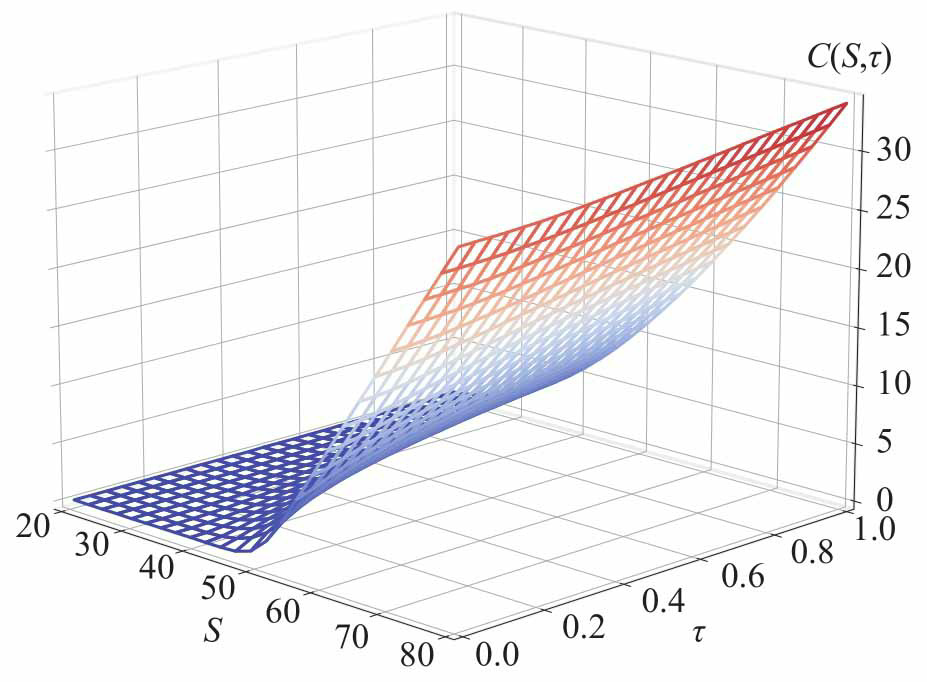  
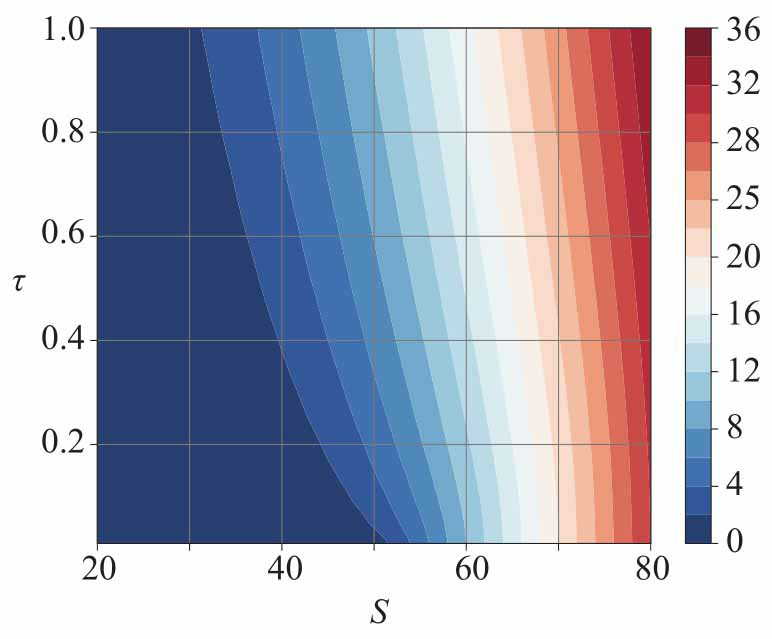  
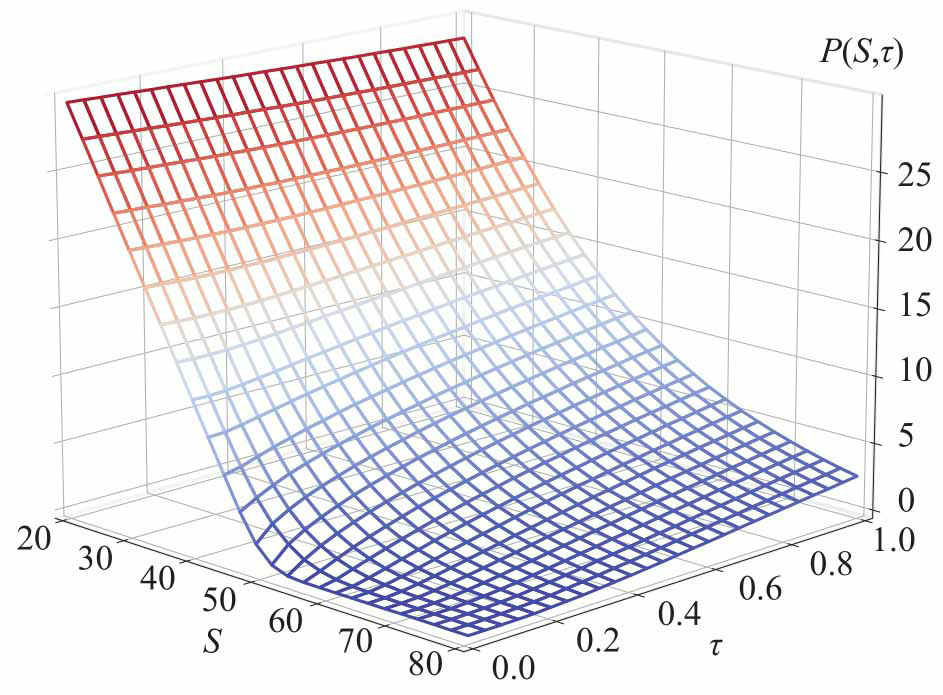  
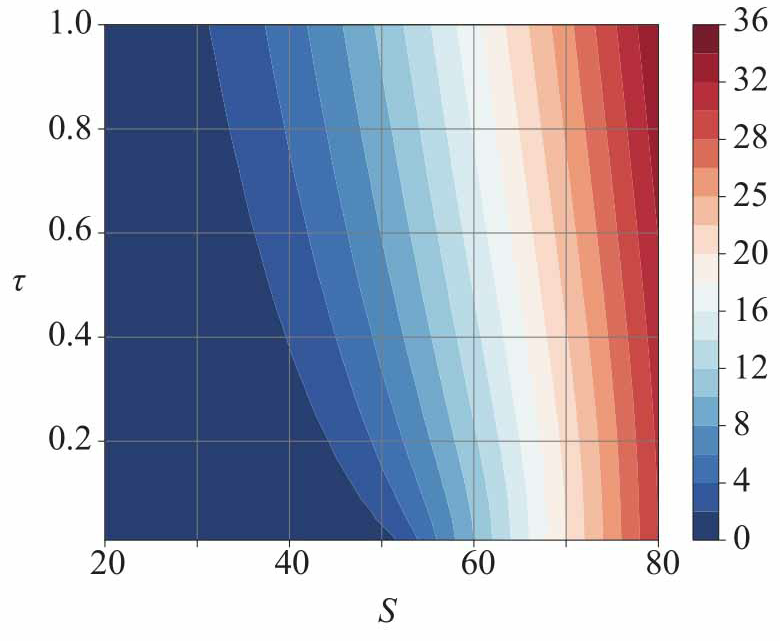  

間斷極限收斂到連續  
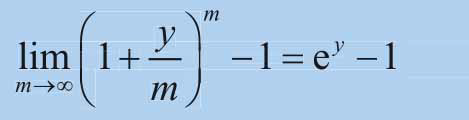  
間斷y與連續r之關係  
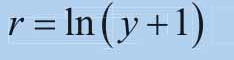  
當r/y無限小，兩者相等  
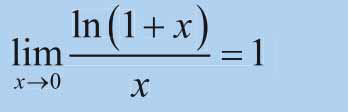

Text(0, 0.5, '$\\frac{\\log{\\left(x + 1 \\right)}}{x}$')

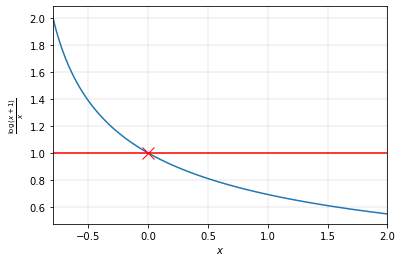

In [9]:
from sympy import latex, lambdify, limit, log
from sympy.abc import x
import numpy as np
from matplotlib import pyplot as plt 

f_x = log(x + 1)/x#function

x_array = np.linspace(-0.8,2,100)

f_x_fcn = lambdify(x,f_x)#array function 連結
f_x_array = f_x_fcn(x_array)#代入

f_x_0_limit = limit(f_x,x,0)#趨向於0

f_x_array = f_x_fcn(x_array)

#%% visualization

plt.close('all')

fig, ax = plt.subplots()

ax.plot(x_array, f_x_array, linewidth = 1.5) 
ax.axhline(y = f_x_0_limit, color = 'r')#直線
ax.plot(0,f_x_0_limit, color = 'r', marker = 'x', markersize = 12)
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
ax.set_xlim(x_array.min(),x_array.max())

ax.set_xlabel('$\it{x}$',fontname = 'Times New Roman')
ax.set_ylabel('$%s$' % latex(f_x), fontname = 'Times New Roman')


導數  
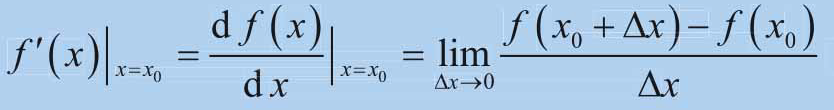  
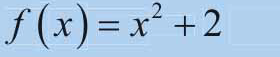  
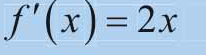  
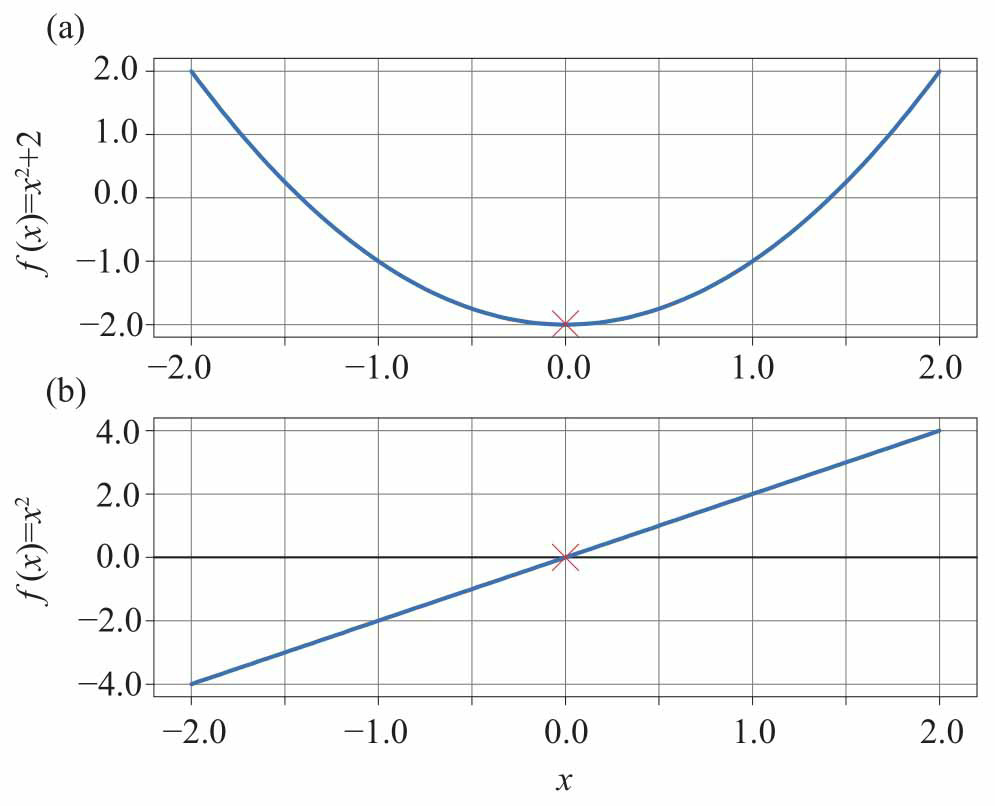  
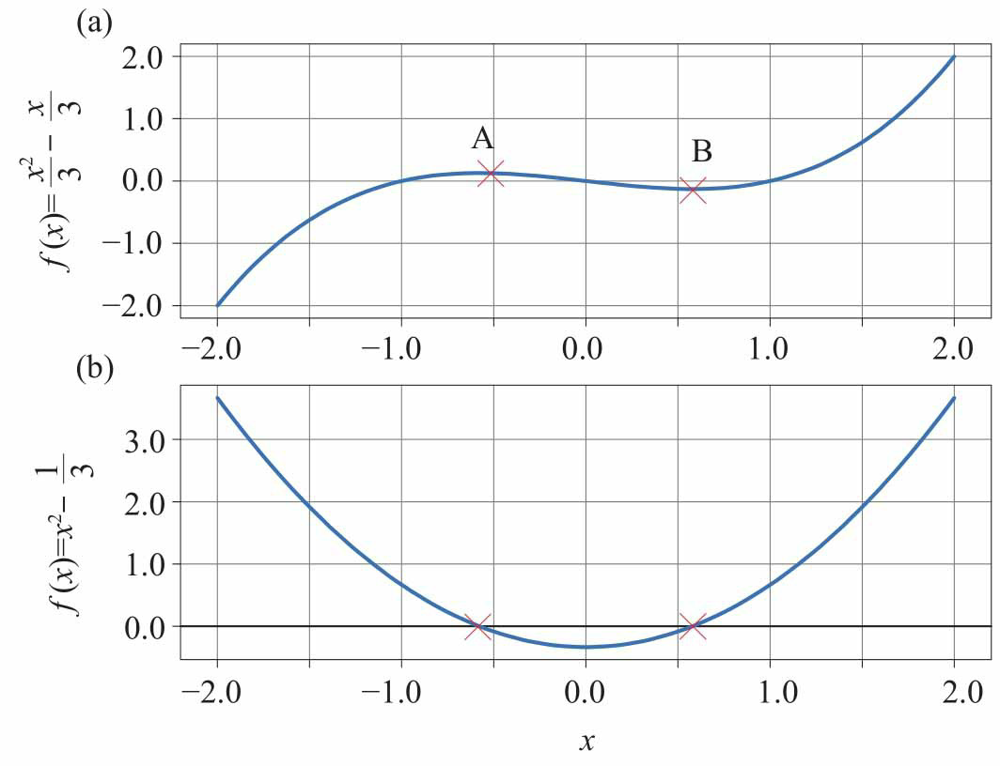  


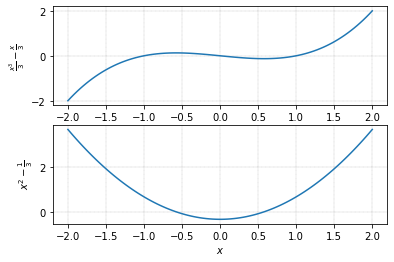

In [14]:
from sympy import latex, lambdify, diff, sin
from sympy.abc import x
import numpy as np
from matplotlib import pyplot as plt 


# f_x = x**2 - 2
f_x = x**3/3 - x/3
# f_x = sin(x)

x_array = np.linspace(-2,2,100)
f_x.evalf(subs = {x: 0})

f_x_fcn = lambdify(x,f_x)
f_x_array = f_x_fcn(x_array)

#%% 1st and 2nd order derivatives

f_x_1_diff = diff(f_x,x)
f_x_1_diff_fcn = lambdify(x,f_x_1_diff)

f_x_1_diff_array = f_x_1_diff_fcn(x_array)

f_x_2_diff = diff(f_x,x,2)
f_x_2_diff_fcn = lambdify(x,f_x_2_diff)

f_x_2_diff_const = f_x_2_diff_fcn(x_array)

#%% plot first order derivative of quadratic function

plt.close('all')

fig, ax = plt.subplots(2,1)

ax[0].plot(x_array, f_x_array, linewidth = 1.5) 
ax[0].set_xlabel("$\it{x}$")
ax[0].set_ylabel('$%s$' % latex(f_x))

ax[0].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

ax[1].plot(x_array, f_x_1_diff_array, linewidth = 1.5) 
ax[1].set_xlabel("$\it{x}$")
ax[1].set_ylabel('$%s$' % latex(f_x_1_diff))

ax[1].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
x_lim = ax[1].get_xlim()


(-2.2, 2.2, -2.2, 2.2)

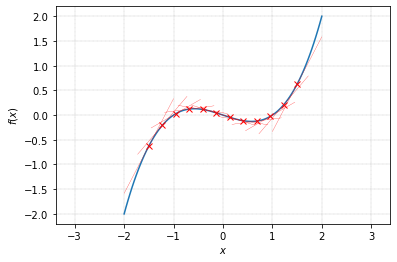

In [15]:
from sympy import lambdify, diff, evalf
from sympy.abc import x
import numpy as np
from matplotlib import pyplot as plt 


f_x = x**2 - 2
f_x = x**3/3 - x/3
# f_x = sin(x)

x_array   = np.linspace(-2,2,100)
x_0_array = np.linspace(-1.5,1.5,12)
f_x.evalf(subs = {x: 0})

f_x_fcn = lambdify(x,f_x)
f_x_array = f_x_fcn(x_array)

#%% plot tangent lines

plt.close('all')

f_x_1_diff = diff(f_x,x)
f_x_1_diff_fcn = lambdify(x,f_x_1_diff)

fig, ax = plt.subplots()

ax.plot(x_array, f_x_array, linewidth = 1.5) 
ax.set_xlabel("$\it{x}$")
ax.set_ylabel("$\it{f}(\it{x})$")

for x_0 in x_0_array:
    
    y_0 = f_x.evalf(subs = {x: x_0})
    x_t_array = np.linspace(x_0-0.5, x_0+0.5, 10)
    a = f_x_1_diff.evalf(subs = {x: x_0})
    
    tangent_f = a*(x - x_0) + y_0
    
    tangent_f_fcn = lambdify(x,tangent_f)
    tangent_array = tangent_f_fcn(x_t_array)
    
    ax.plot(x_t_array, tangent_array, linewidth = 0.25, color = 'r') 
    ax.plot(x_0,y_0,marker = 'x', color = 'r')

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
plt.axis('equal')


偏導數  
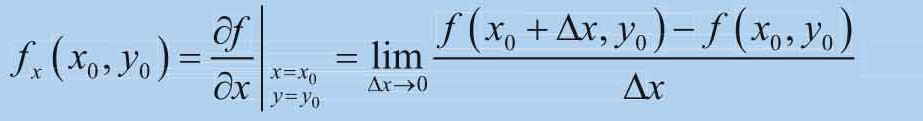  
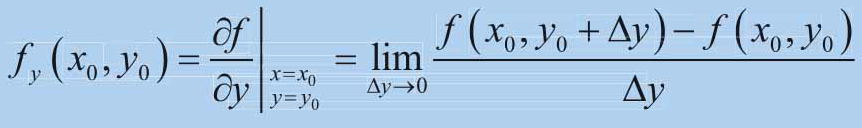  
例子  
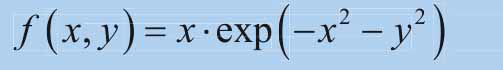  
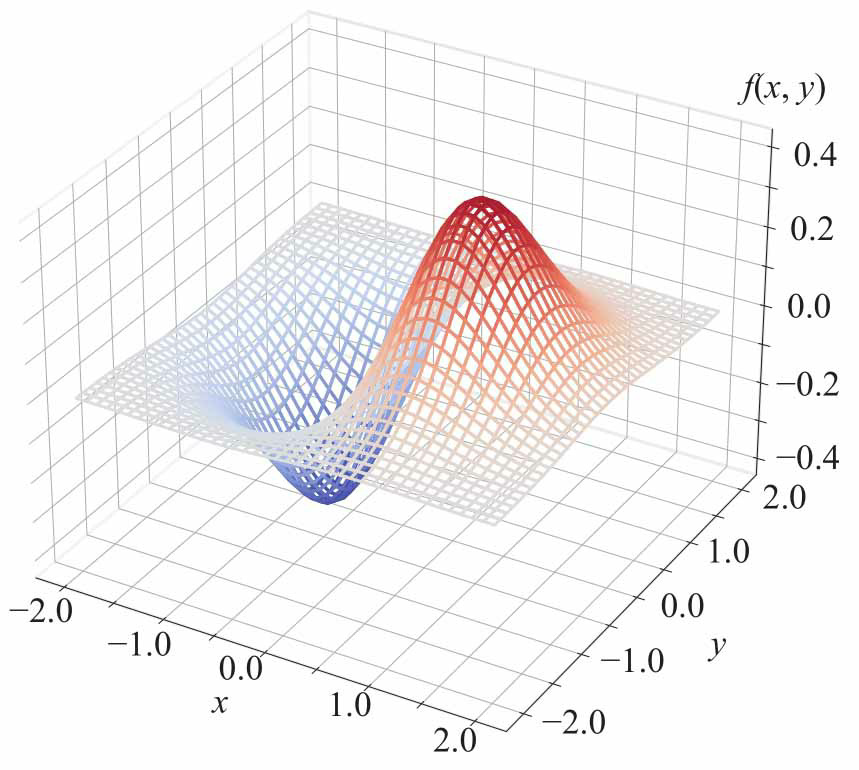  
一階偏導  
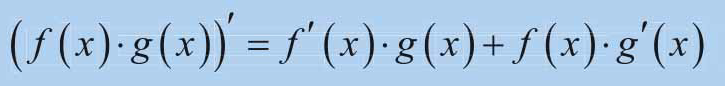  
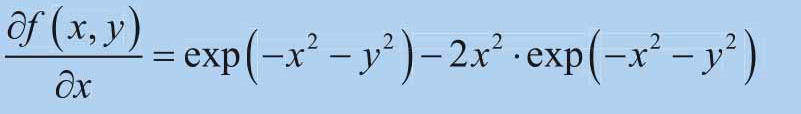  
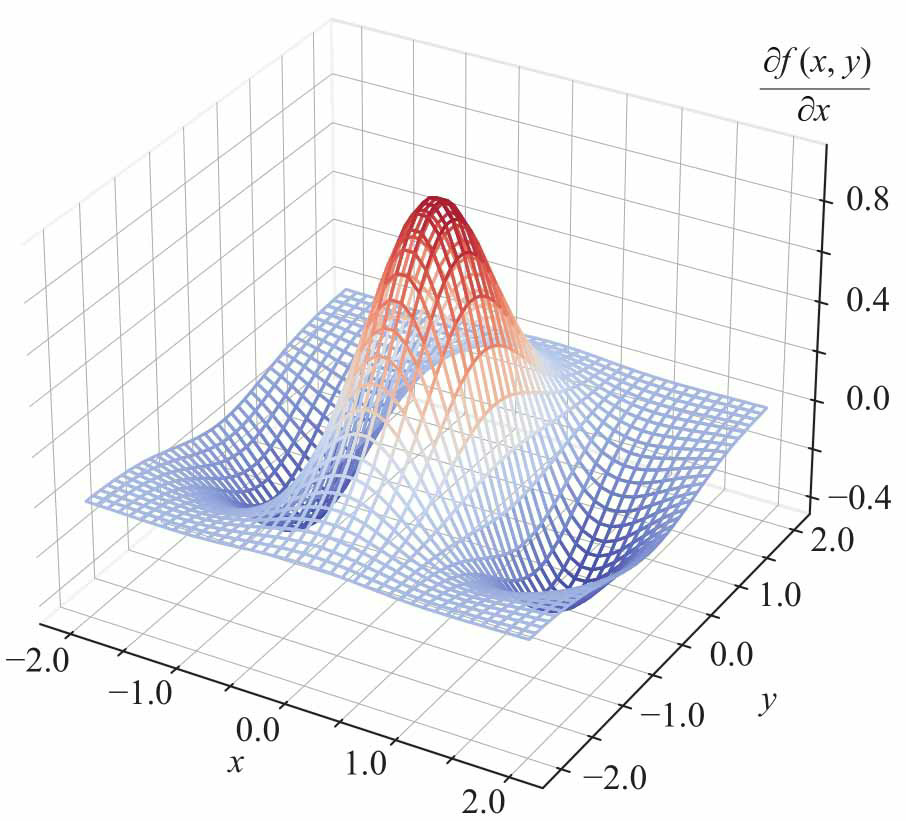  
同理  
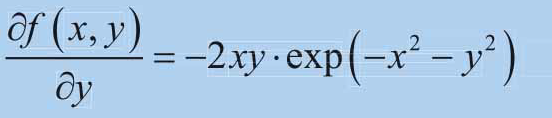  
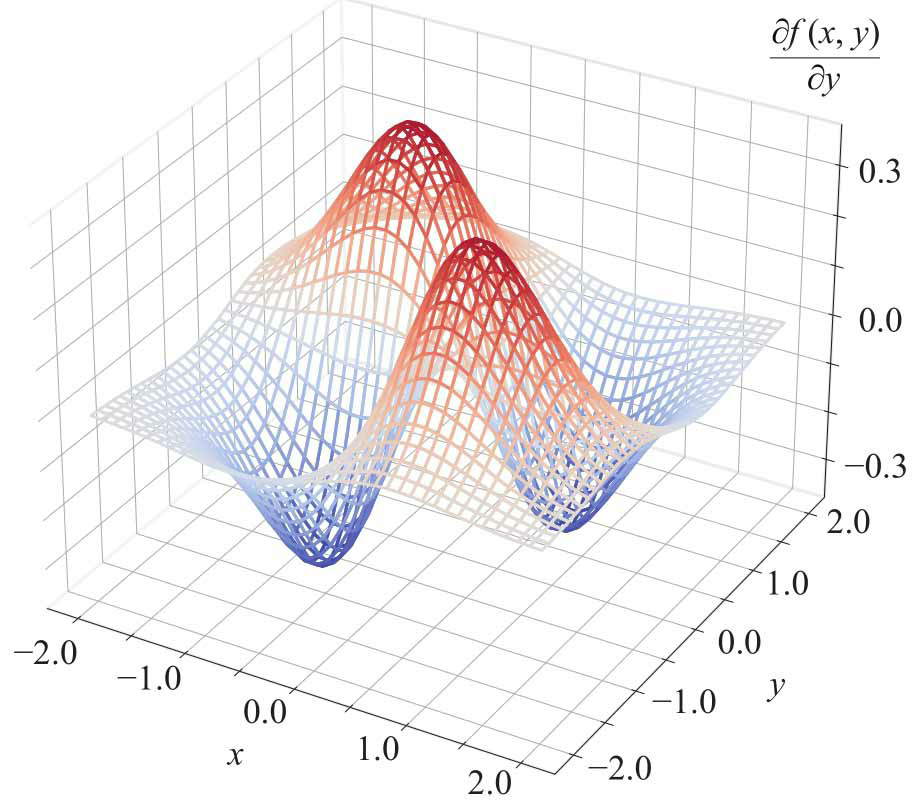  
二階  
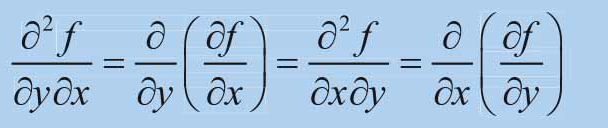  
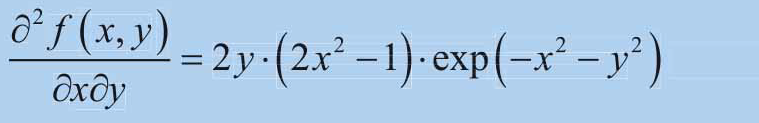  
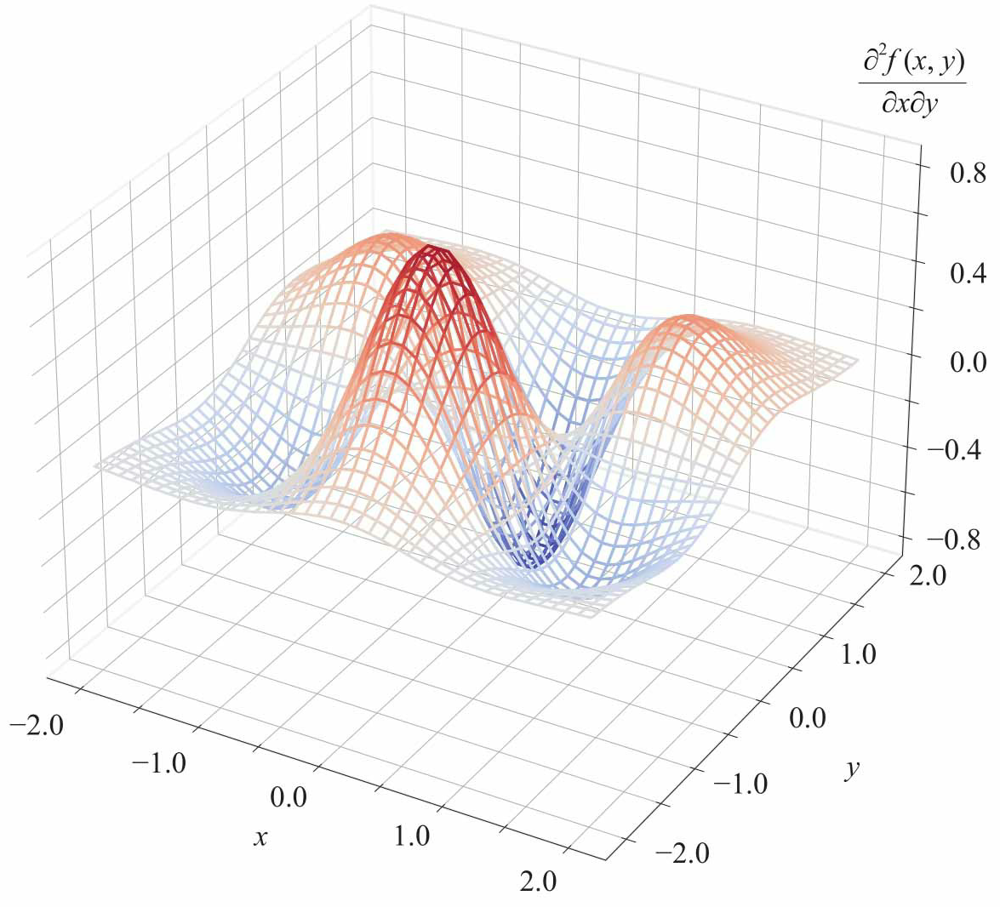  




C:\Users\antho\AppData\Local\Temp/ipykernel_8412/1141648525.py:26: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


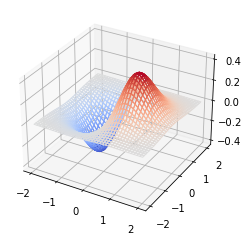

<Figure size 432x288 with 0 Axes>

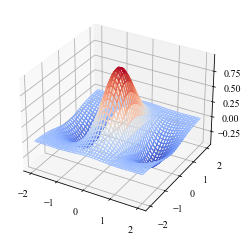

<Figure size 432x288 with 0 Axes>

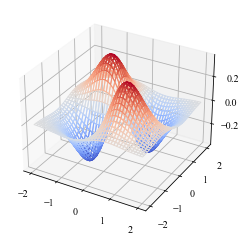

<Figure size 432x288 with 0 Axes>

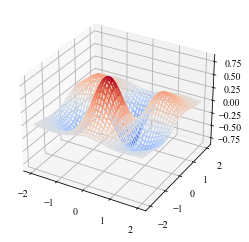

<Figure size 432x288 with 0 Axes>

In [16]:
from sympy import lambdify, diff, exp, latex
from sympy.abc import x, y
import numpy as np
from matplotlib import pyplot as plt 
import math
from matplotlib import cm

def mesh_square(x0,y0,r,num):
    
    # generate mesh using polar coordinates
 
    rr = np.linspace(-r,r,num)
    xx,yy = np.meshgrid(rr,rr);
 
    xx = xx + x0; 
    yy = yy + y0;
    
    return xx, yy

def plot_surf(xx,yy,zz,caption):

    norm_plt = plt.Normalize(zz.min(), zz.max())
    colors = cm.coolwarm(norm_plt(zz))

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(xx,yy,zz,
    facecolors=colors, shade=False)
    surf.set_facecolor((0,0,0,0))
    # z_lim = [zz.min(),zz.max()]
    # ax.plot3D([0,0],[0,0],z_lim,'k')
    plt.show()

    plt.tight_layout()
    ax.set_xlabel('$\it{x}$',fontname = 'Times New Roman')
    ax.set_ylabel('$\it{y}$',fontname = 'Times New Roman')

    ax.set_zlabel('$%s$' % latex(caption), fontname = 'Times New Roman')


    ax.xaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
    ax.yaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
    ax.zaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})

    plt.rcParams["font.family"] = "Times New Roman"
    plt.rcParams["font.size"] = "10"

#%% Initialization

x0  = 0;  # center of the mesh
y0  = 0;  # center of the mesh
r   = 2;  # radius of the mesh
num = 40; # number of mesh grids
xx,yy = mesh_square(x0,y0,r,num); # generate mesh

#%% plot f(x,y)

plt.close('all')

f_xy = x*exp(- x**2 - y**2);

f_xy_fcn = lambdify([x,y],f_xy)

f_xy_zz = f_xy_fcn(xx,yy)

caption = f_xy

plot_surf(xx,yy,f_xy_zz,caption)

#%% plot partial df/dx

df_dx = f_xy.diff(x)
df_dx_fcn = lambdify([x,y],df_dx)

df_dx_zz = df_dx_fcn(xx,yy)

caption = df_dx

plot_surf(xx,yy,df_dx_zz,caption)

#%% plot partial df/dy

df_dy = f_xy.diff(y)
df_dy_fcn = lambdify([x,y],df_dy)

df_dy_zz = df_dy_fcn(xx,yy)

caption = df_dy

plot_surf(xx,yy,df_dy_zz,caption)

#%% plot partial d2f/dx/dy

df_dxdy = f_xy.diff(x,y)
# df_dxdy = df_dy.diff(x)
# df_dxdy = df_dx.diff(y)

df_dxdy_fcn = lambdify([x,y],df_dxdy)

df_dxdy_zz = df_dxdy_fcn(xx,yy)

caption = df_dxdy

plot_surf(xx,yy,df_dxdy_zz,caption)



Chain rule  
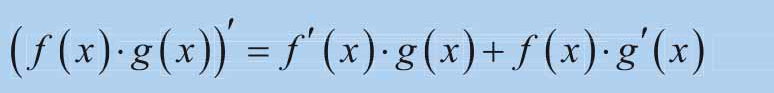  
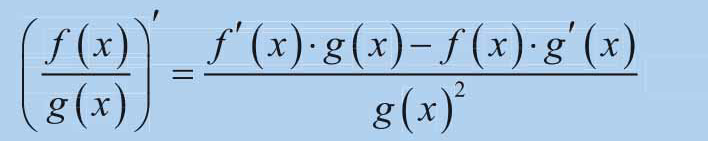  
複合
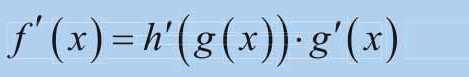  
BSM例子  
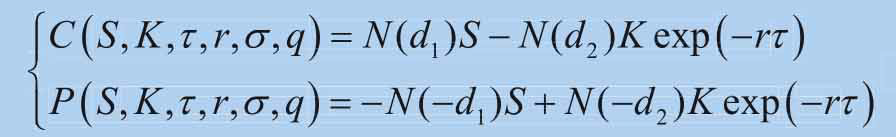  
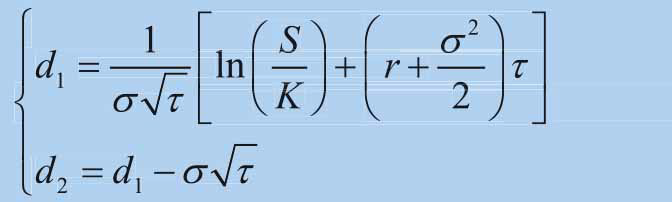  
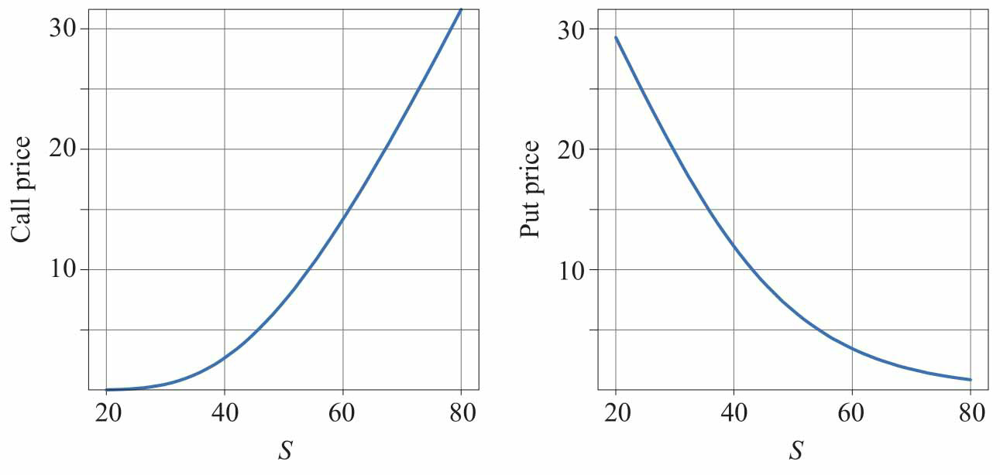  


Call對S偏導推導  
標準常態CDF與為1階導數(CDF1階=PDF)  
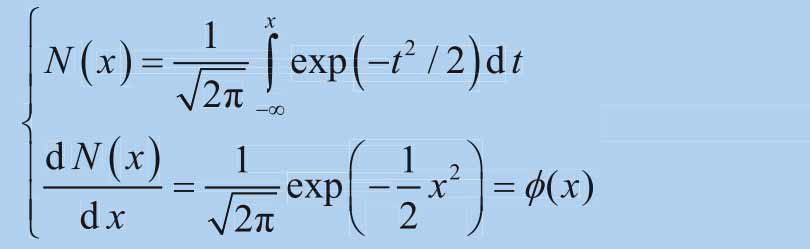 
N(d1)對d1的1階導(代入)  
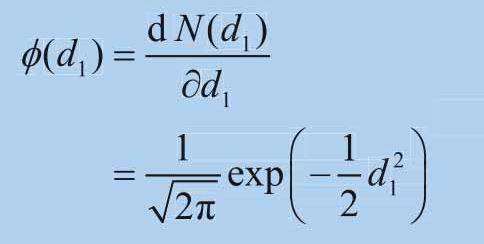  
N(d2)對d2的1階導(d2=d1-sigma*t**0.5)  
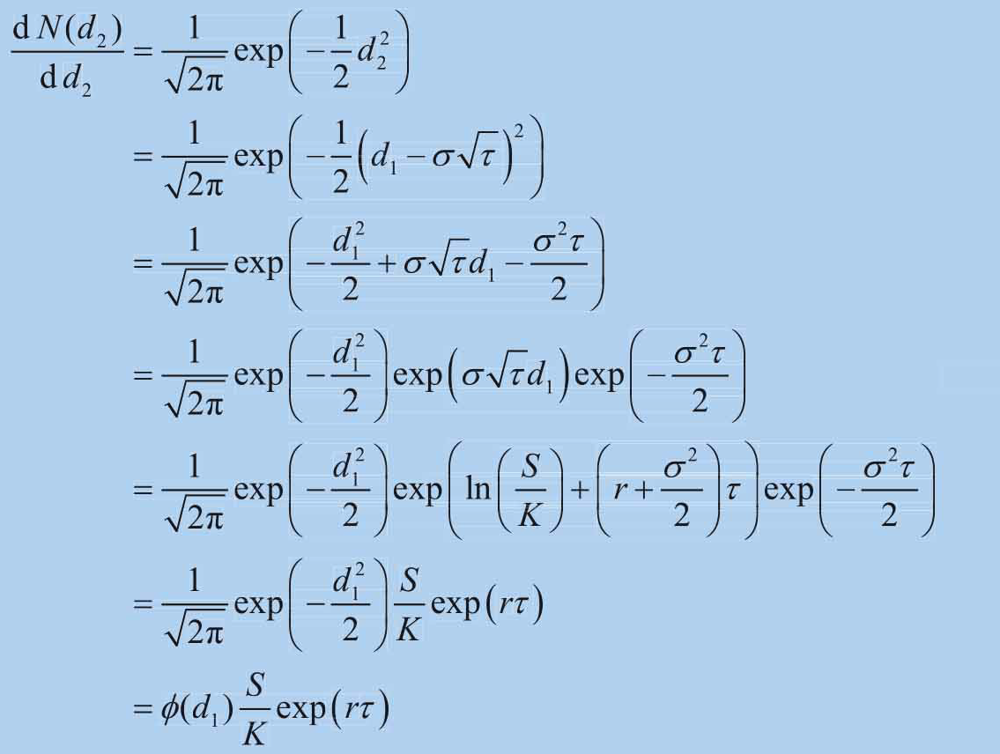  
d1對S偏導  
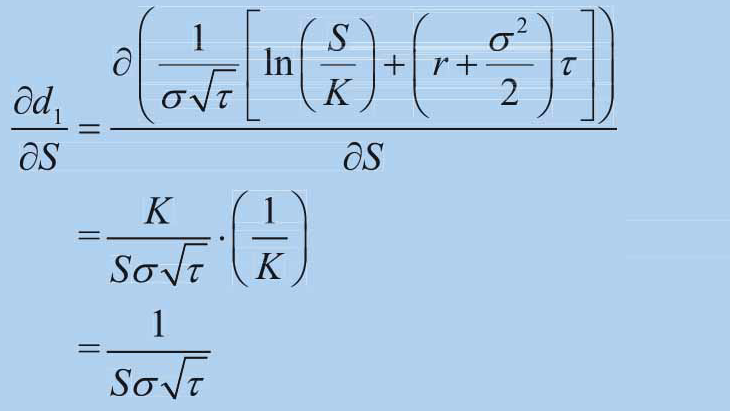   
d2對S偏導    
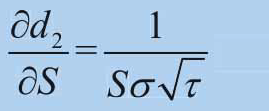  
C對S求一階導  
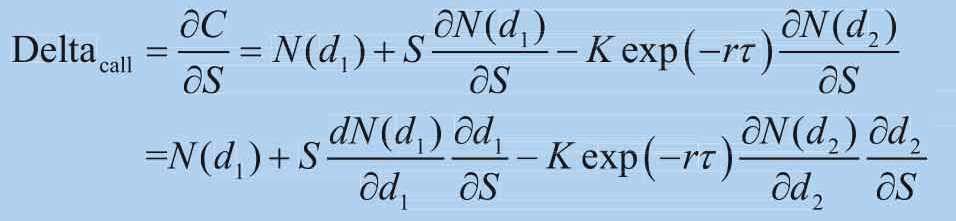  
導數代入，即N(d1)為Call delta  
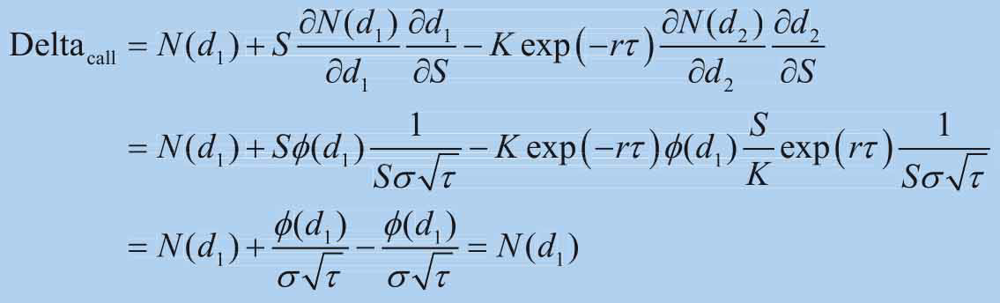  
同理  
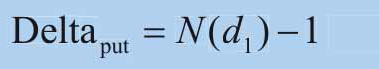  
Call對S 2階偏導  
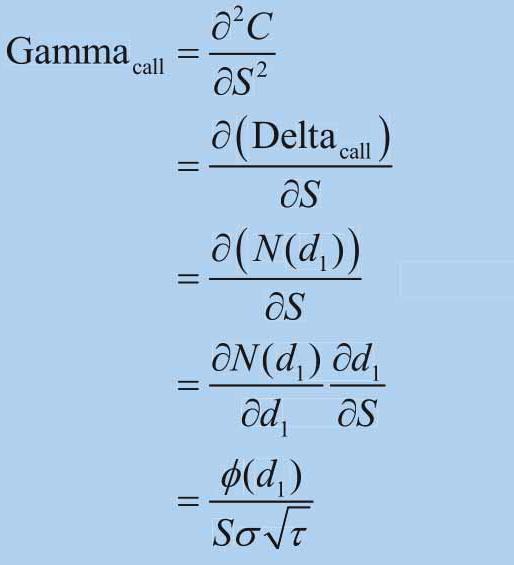  
Put會得同結果
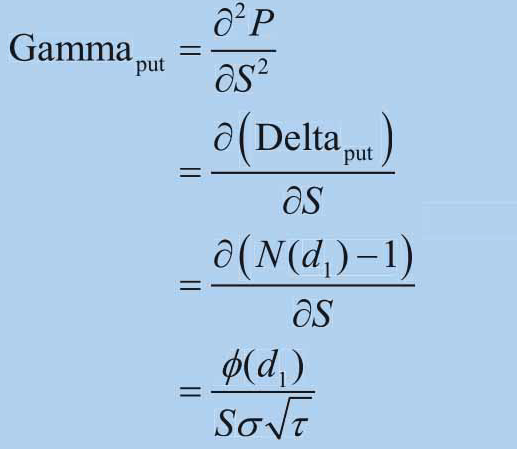  




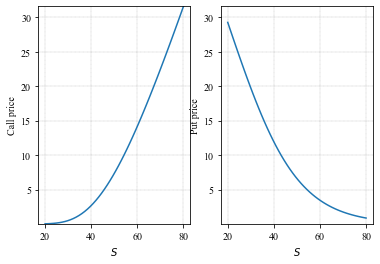

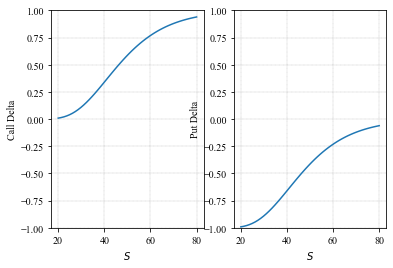

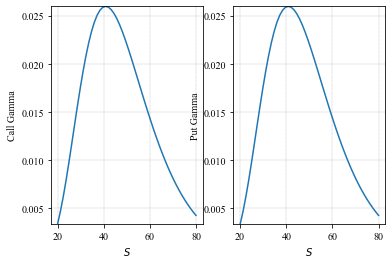

In [17]:
import math
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def blsprice(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    
    Call = norm.cdf(d1, loc=0, scale=1)*St - \
        norm.cdf(d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    Put  = -norm.cdf(-d1, loc=0, scale=1)*St + \
        norm.cdf(-d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    return Call, Put


def blsdelta(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    Delta_call  = norm.cdf(d1, loc=0, scale=1)
    Delta_put   = -norm.cdf(-d1, loc=0, scale=1)
    return Delta_call, Delta_put

def blsgamma(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
        
    Gamma = norm.pdf(d1)/St/vol/math.sqrt(tau);

    return Gamma

def plot_curve(x,y1,y2,caption):
    
    fig, axs = plt.subplots(1,2)

    axs[0].plot(x, y1)
    axs[0].set_xlabel('$\it{S}$', fontname="Times New Roman", fontsize=10)
    y_label = 'Call ' + caption
    y_joint = np.concatenate((y1, y2))
    axs[0].set_ylim([y_joint.min(),y_joint.max()])
    if caption =='Delta':
        axs[0].set_ylim([-1,1])

    axs[0].set_ylabel(y_label, fontname="Times New Roman", fontsize=10)
    axs[0].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

    axs[1].plot(x, y2)
    axs[1].set_xlabel('$\it{S}$', fontname="Times New Roman", fontsize=10)
    y_label = 'Put ' + caption
    axs[1].set_ylim([y_joint.min(),y_joint.max()])
    if caption == 'Delta':
        axs[1].set_ylim([-1,1])
    axs[1].set_ylabel(y_label, fontname="Times New Roman", fontsize=10)
    axs[1].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

# end of function

blsprice_vec = np.vectorize(blsprice)
blsdelta_vec = np.vectorize(blsdelta)
blsgamma_vec = np.vectorize(blsgamma)

S_array  = np.linspace(20,80,50);

K = 50;    # strike price
r = 0.03;  # risk-free rate
vol = 0.5; # volatility 
tau = 0.5;     # time to maturity

#%% option vs S

plt.close('all')

Call_array, Put_array = blsprice_vec(S_array, K, tau, r, vol)
caption = 'price'
plot_curve(S_array,Call_array,Put_array,caption)

#%% Delta vs S

Call_Delta_array, Put_Delta_array = blsdelta_vec(S_array, K, tau, r, vol)
caption = 'Delta'
plot_curve(S_array,Call_Delta_array,Put_Delta_array,caption)

#%% Gamma vs S

Gamma_array = blsgamma_vec(S_array, K, tau, r, vol)
caption = 'Gamma'
plot_curve(S_array,Gamma_array,Gamma_array,caption)


一元泰勒展開式，其中a為expansion point  
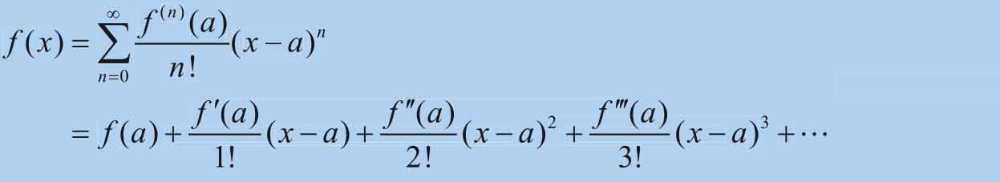  
e**x在x=0的展開式(不同階數)  
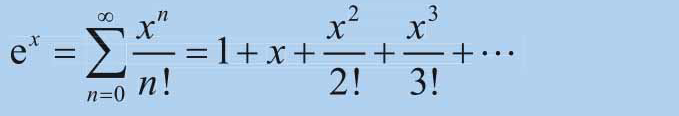  
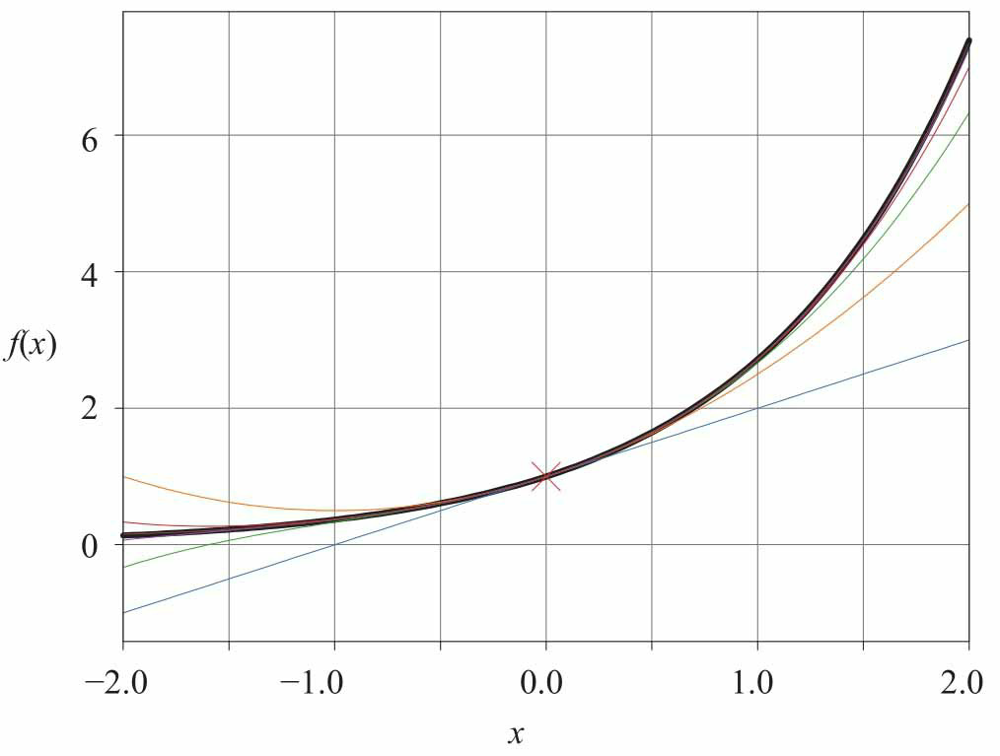  
ln(x+1)展開式  
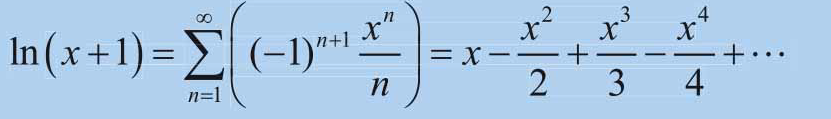  
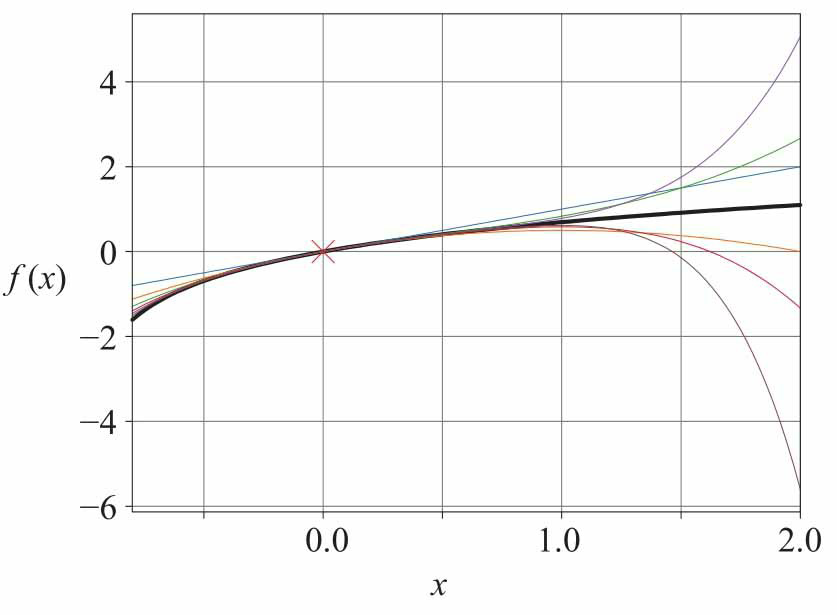






(-0.8, 2.0)

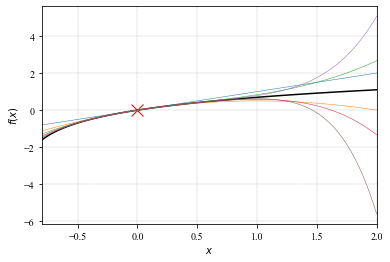

In [18]:
from sympy import latex, lambdify, diff, sin, log, exp, series
from sympy.abc import x
import numpy as np
from matplotlib import pyplot as plt 

f_x = exp(x) # y + 1 = exp(r)
x_array = np.linspace(-2,2,100)

f_x = log(x + 1) # ln(y + 1) = r
x_array = np.linspace(-0.8,2,100)

x_0 = 0

y_0 = f_x.evalf(subs = {x: x_0})

f_x_fcn = lambdify(x,f_x)
f_x_array = f_x_fcn(x_array)

#%% Visualization

plt.close('all')

fig, ax = plt.subplots()

ax.plot(x_array, f_x_array, 'k', linewidth = 1.5) 
ax.plot(x_0, y_0, 'xr', markersize = 12) 
ax.set_xlabel("$\it{x}$")
ax.set_ylabel("$\it{f}(\it{x})$")

order_array = np.arange(2,8)

for order in order_array:

    f_series = f_x.series(x,x_0,order).removeO()
    f_series_fcn = lambdify(x,f_series)
    f_series_array = f_series_fcn(x_array)
    ax.plot(x_array, f_series_array, linewidth = 0.5) 

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
ax.set_xlim(x_array.min(),x_array.max())


1階展開，即delta  
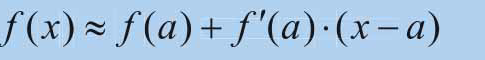  
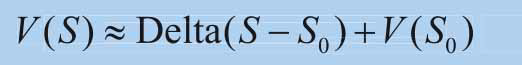  
delta估計Call Put價  
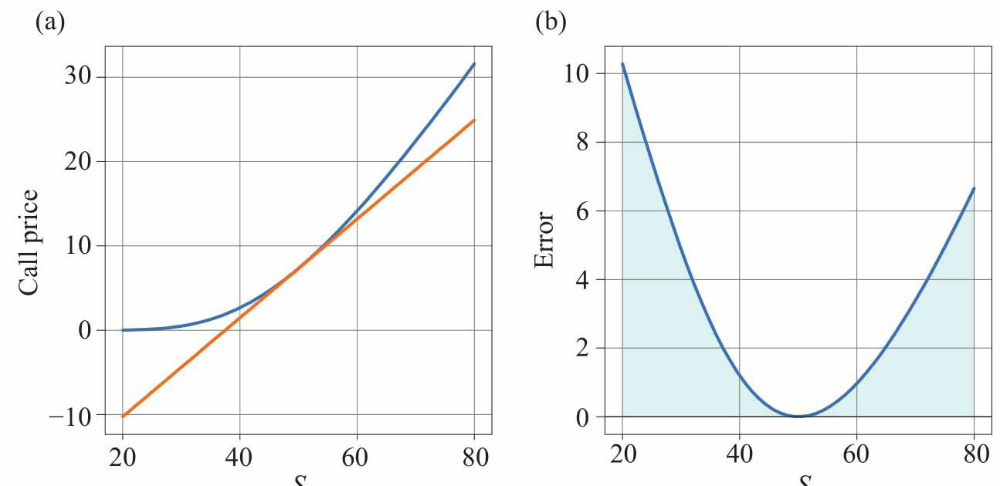  
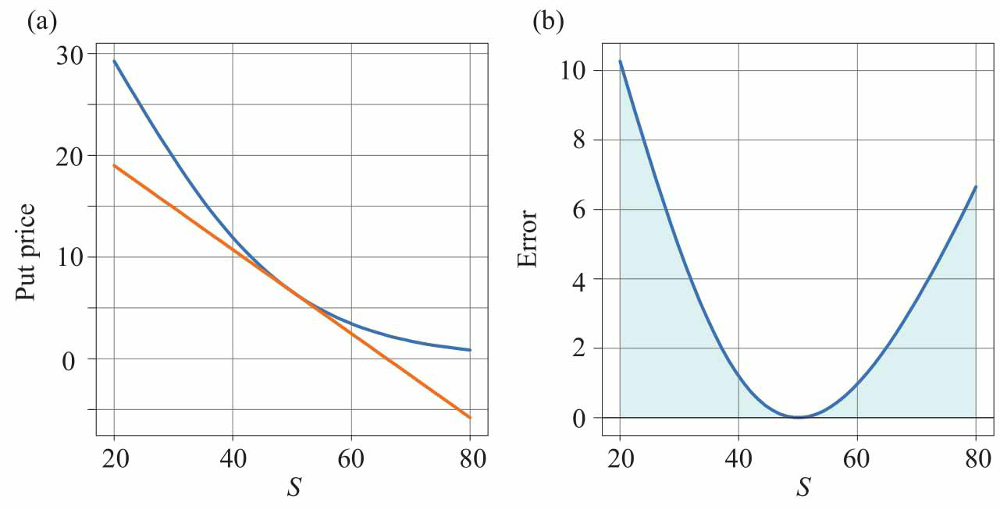  
2階展開  
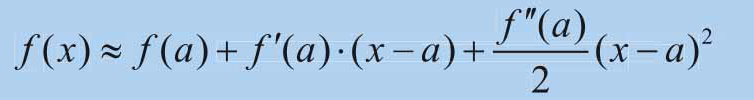  
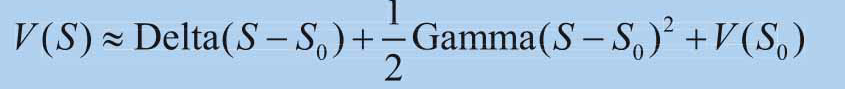  
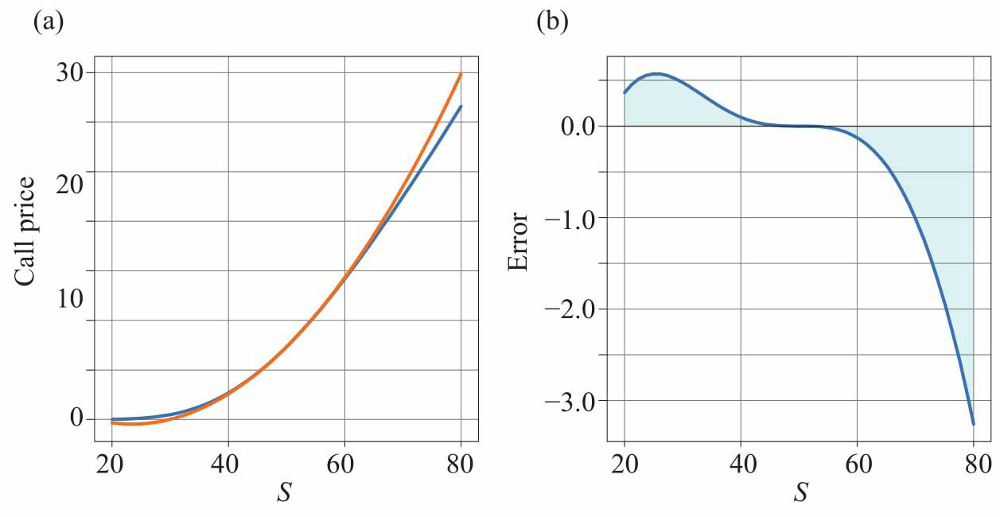  
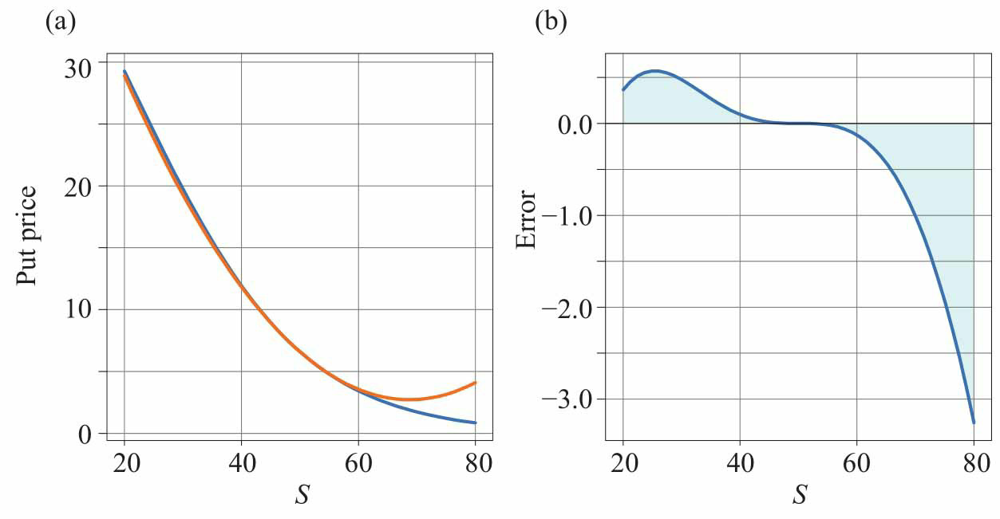  




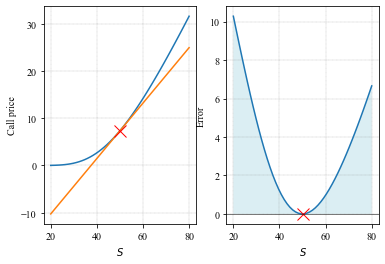

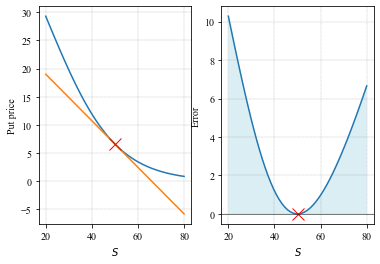

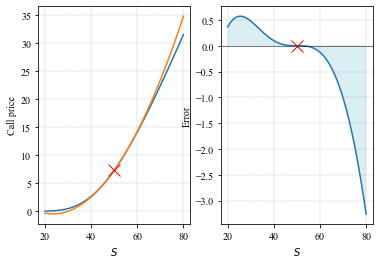

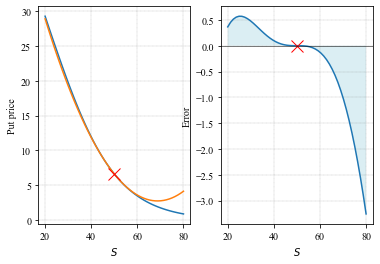

In [21]:
import math
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def blsprice(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    
    Call = norm.cdf(d1, loc=0, scale=1)*St - \
        norm.cdf(d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    Put  = -norm.cdf(-d1, loc=0, scale=1)*St + \
        norm.cdf(-d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    return Call, Put


def blsdelta(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    Delta_call  = norm.cdf(d1, loc=0, scale=1)
    Delta_put   = -norm.cdf(-d1, loc=0, scale=1)
    return Delta_call, Delta_put

def blsgamma(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
        
    Gamma = norm.pdf(d1)/St/vol/math.sqrt(tau);

    return Gamma

def plot_curve(x,y1,y2,x0,y0,caption):
    
    fig, axs = plt.subplots(1,2)

    axs[0].plot(x, y1)
    axs[0].plot(x, y2)
    axs[0].plot(x0, y0, 'xr', markersize = 12)
    axs[0].set_xlabel('$\it{S}$', fontname="Times New Roman", fontsize=10)
    y_label = caption + ' price'
    axs[0].set_ylabel(y_label, fontname="Times New Roman", fontsize=10)
    axs[0].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

    axs[1].plot(x, y1 - y2)
    axs[1].plot(x0, 0, 'xr', markersize = 12)
    plt.axhline(y=0, color='k', linewidth = 0.5)
    axs[1].fill_between(x, y1 - y2, 0, facecolor = np.divide([219, 238, 243], 255))
    axs[1].set_xlabel('$\it{S}$', fontname="Times New Roman", fontsize=10)
    axs[1].set_ylabel('Error', fontname="Times New Roman", fontsize=10)
    axs[1].grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

# end of function

blsprice_vec = np.vectorize(blsprice)
blsdelta_vec = np.vectorize(blsdelta)
blsgamma_vec = np.vectorize(blsgamma)

S_array  = np.linspace(20,80,50);#現價=50

K = 50;    # strike price
r = 0.03;  # risk-free rate
vol = 0.5; # volatility 
tau = 0.5;     # time to maturity

#現價點
S_0 = 50;  # expansion point
C_0, P_0 = blsprice_vec(S_0, K, tau, r, vol)
Delta_C_0, Delta_P_0 = blsdelta_vec(S_0, K, tau, r, vol)
Gamma_0 = blsgamma_vec(S_0, K, tau, r, vol)

Call_array, Put_array = blsprice_vec(S_array, K, tau, r, vol)

#%% Delta approximation

plt.close('all')

Call_delta_apprx = Delta_C_0*(S_array - S_0) + C_0#每個價與現價差距*delta+現價
caption = 'Call'
plot_curve(S_array,Call_array,Call_delta_apprx,S_0,C_0,caption)

Put_delta_apprx = Delta_P_0*(S_array - S_0) + P_0
caption = 'Put'
plot_curve(S_array,Put_array,Put_delta_apprx,S_0,P_0,caption)


#%% Delta-Gamma approximation

Call_delta_gamma_apprx = Delta_C_0*(S_array - S_0) + Gamma_0*np.power((S_array - S_0),2)/2 + C_0
caption = 'Call'
plot_curve(S_array,Call_array,Call_delta_gamma_apprx,S_0,C_0,caption)

Put_delta_gamma_apprx = Delta_P_0*(S_array - S_0) + Gamma_0*np.power((S_array - S_0),2)/2 + P_0
caption = 'Put'
plot_curve(S_array,Put_array,Put_delta_gamma_apprx,S_0,P_0,caption)


數值微分包括前向 後向與中心(希臘字母跟債券duration一般用此法取得)    
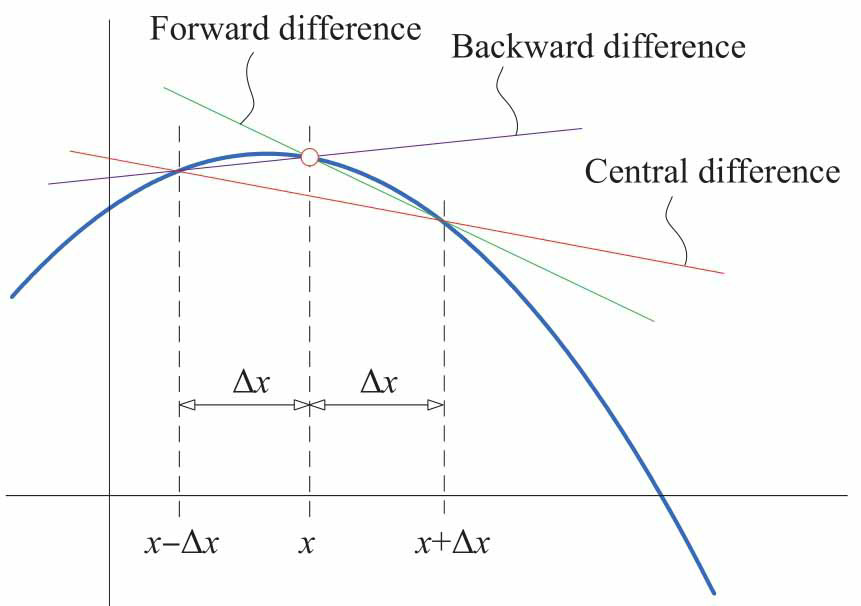  
中心差分估一階導數  
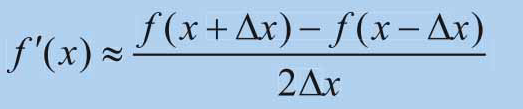  
估選擇權delta  
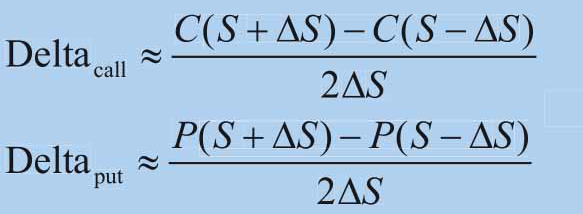  
不同步長下次delta(S不變下)  
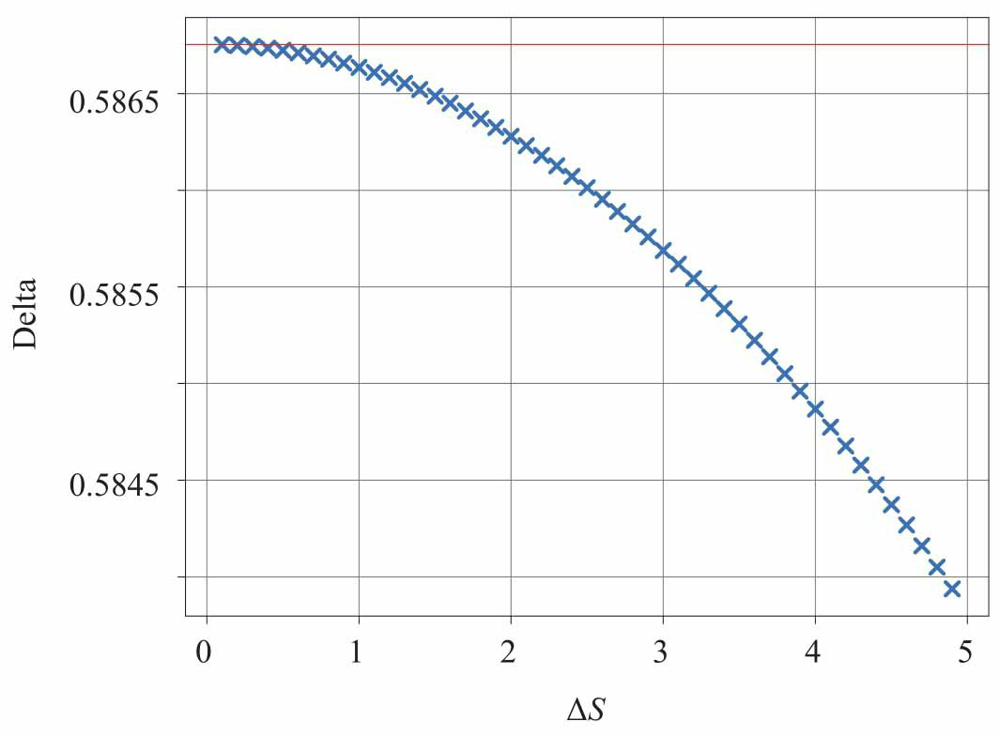  
二階  
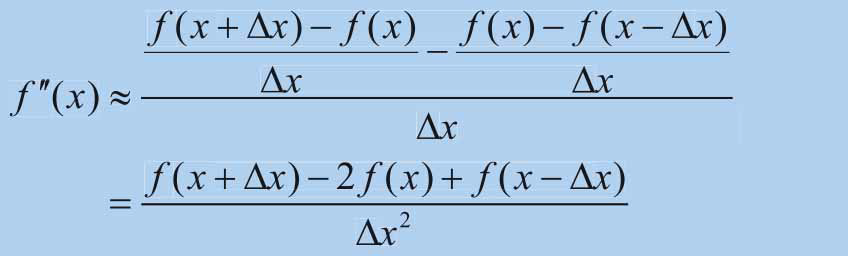  
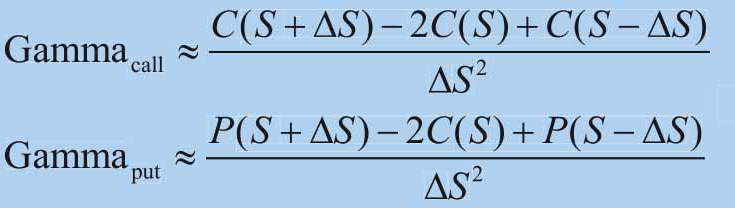  
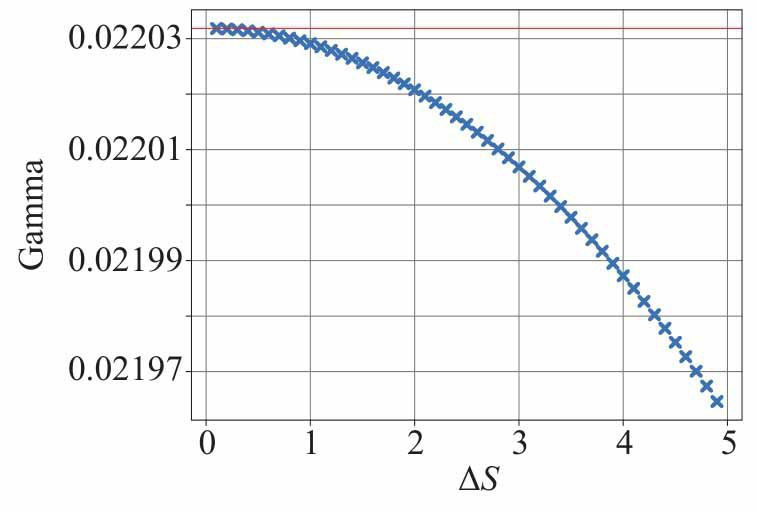  
步長愈少，結果愈接近解釋法(即BSM的d1)  


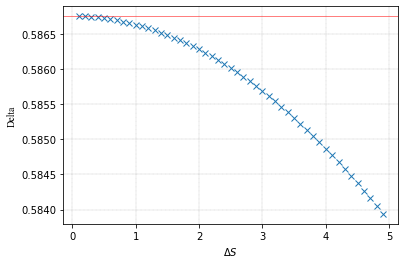

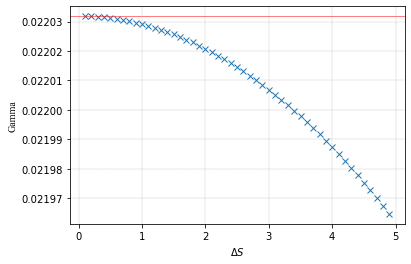

In [6]:
import numpy as np
import math
import matplotlib.pyplot as plt
from scipy.stats import norm

def blsprice(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    
    Call = norm.cdf(d1, loc=0, scale=1)*St - \
        norm.cdf(d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    Put  = -norm.cdf(-d1, loc=0, scale=1)*St + \
        norm.cdf(-d2, loc=0, scale=1)*K*math.exp(-r*tau)
        
    return Call, Put


def blsdelta(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
    d2 = d1 - vol*math.sqrt(tau);
    Delta_call  = norm.cdf(d1, loc=0, scale=1)
    Delta_put   = -norm.cdf(-d1, loc=0, scale=1)
    return Delta_call, Delta_put

def blsgamma(St, K, tau, r, vol):
    '''
    St: current price of underlying asset
    K:  strike price
    tau: time to maturity
    r: annualized risk-free rate
    vol: annualized asset price volatility
    '''
    
    d1 = (math.log(St / K) + (r + 0.5 * vol ** 2)\
          *tau) / (vol * math.sqrt(tau));
        
    Gamma = norm.pdf(d1)/St/vol/math.sqrt(tau);

    return Gamma

S_0 = 50;    # current spot price
K = 50;    # strike price
r = 0.03;  # risk-free rate
vol = 0.5; # volatility 
tau = 0.5;     # time to maturity

blsprice_vec = np.vectorize(blsprice)
blsdelta_vec = np.vectorize(blsdelta)
blsgamma_vec = np.vectorize(blsgamma)

C_0, _ = blsprice_vec(S_0, K, tau, r, vol)#c p initial 價
Delta_C_0, _ = blsdelta_vec(S_0, K, tau, r, vol)
Gamma_0 = blsgamma_vec(S_0, K, tau, r, vol)

Delta_S_array = np.arange(0.1,5.0,0.1)#0.1開始到 5-0.1

Delta_apprx = np.full_like(Delta_S_array,0)#對應量之全0
Gamma_apprx = np.full_like(Delta_S_array,0)

i = 0;

for Delta_S in Delta_S_array:
    
    
    C_up, _   = blsprice_vec(S_0 + Delta_S, K, tau, r, vol)#上升時之option price
    C_down, _ = blsprice_vec(S_0 - Delta_S, K, tau, r, vol)#下降
    
    Delta_apprx[int(i)] = (C_up - C_down)/2/Delta_S
    
    Gamma_apprx[int(i)] = (C_up - 2.0*C_0+ C_down)/Delta_S**2
    
    i += 1

#%% visualize numerical Delta and Gamma

plt.close('all')

fig, axs = plt.subplots()

axs.plot(Delta_S_array, Delta_apprx, linestyle = 'none', marker = 'x')
plt.axhline(y=Delta_C_0, color='r', linewidth = 0.5)

axs.set_xlabel('$\Delta\it{S}$', fontname="Times New Roman", fontsize=10)
axs.set_ylabel('Delta', fontname="Times New Roman", fontsize=10)
axs.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

fig, axs = plt.subplots()

axs.plot(Delta_S_array, Gamma_apprx, linestyle = 'none', marker = 'x')
plt.axhline(y=Gamma_0, color='r', linewidth = 0.5)

axs.set_xlabel('$\Delta\it{S}$', fontname="Times New Roman", fontsize=10)
axs.set_ylabel('Gamma', fontname="Times New Roman", fontsize=10)
axs.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])


最佳化  
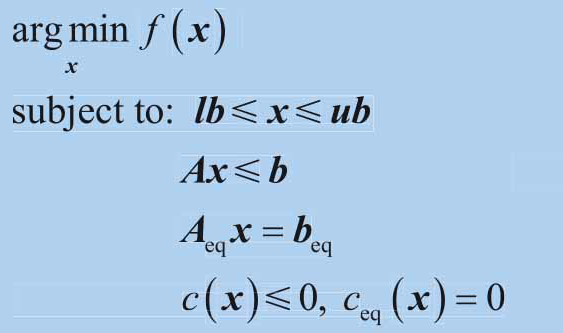  
其中x為需要最佳化變數  
lb ub分為為lower/upper bound
  
Ax<=b為linear inequality constraint  
Aeqx = beq為linear equality constraint 
  
cx<=0為nonlinear inequality constraint  
ceqx=0為linear equality constraint  
以投組為例，投組變異為  
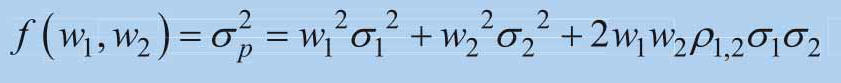  
假設  
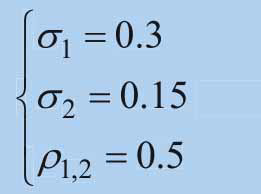  
即最佳化問題為  
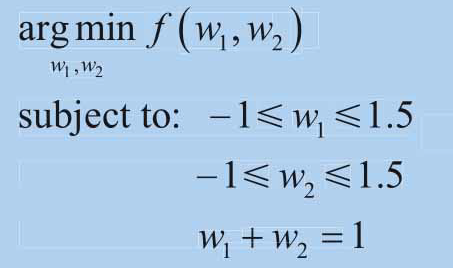  
scipy.optimize.minimize（） 求解最佳化  
scipy.optimize.Bounds（） 構造上下限  
w1+w2=1為等式約束，使用cipy.optimize.LinearConstraint（）  
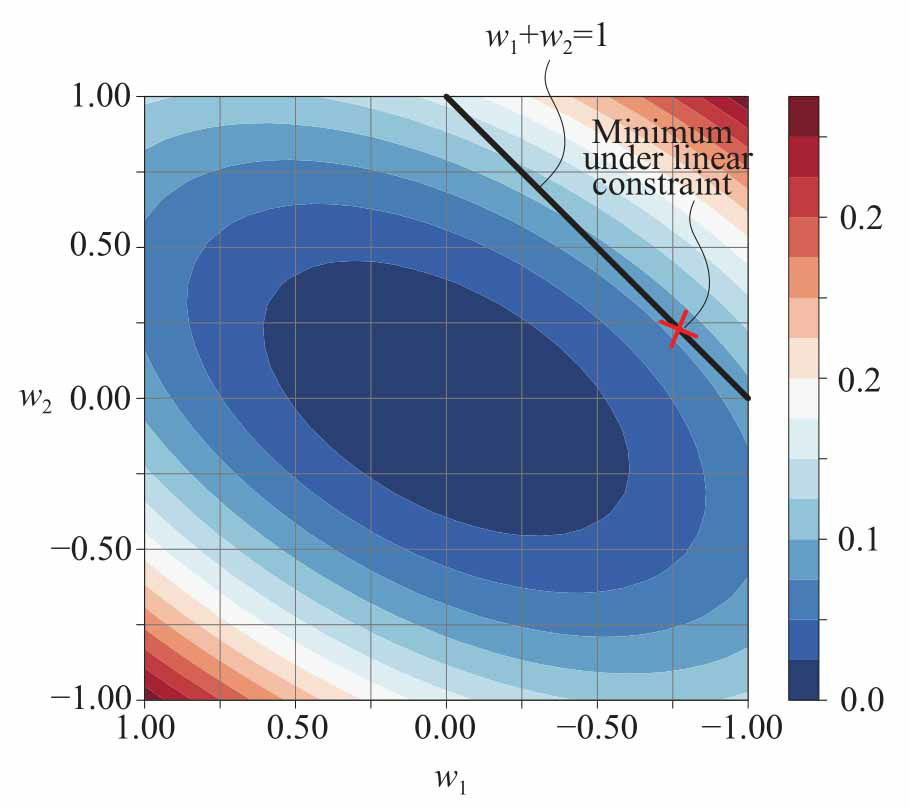  
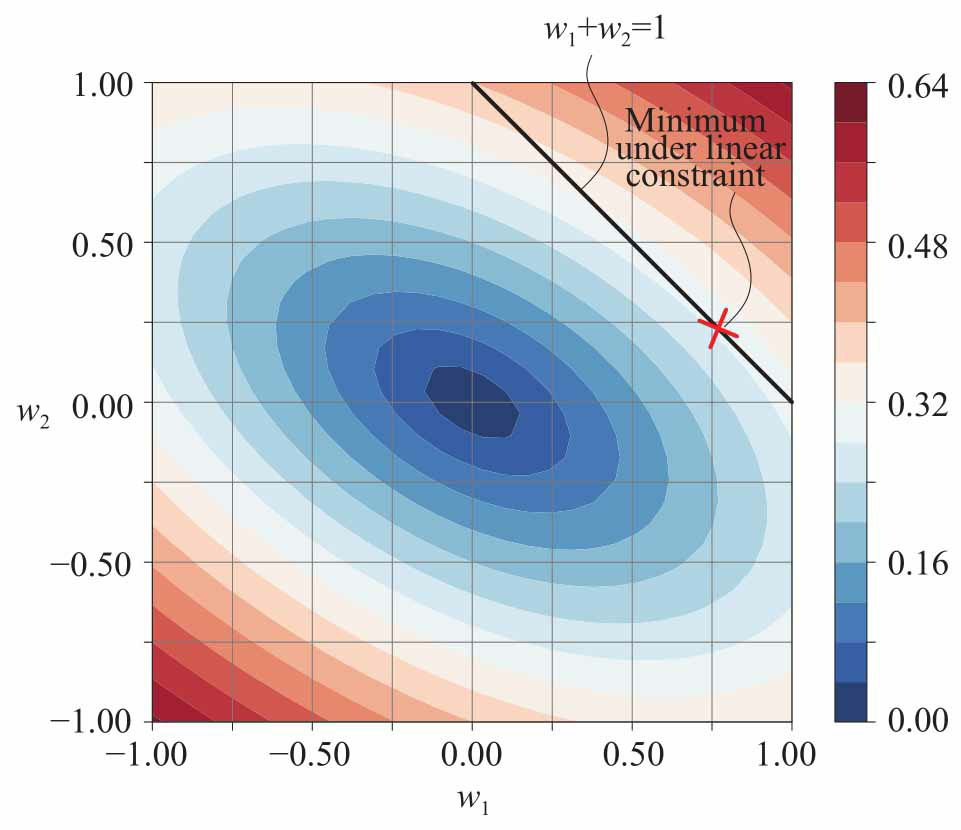
黑色線為w1+w2=1，紅叉為最佳解  


==== Optimized weights ====
[0.76922669 0.23077331]
==== Optimized objective ====
0.0830769230790815


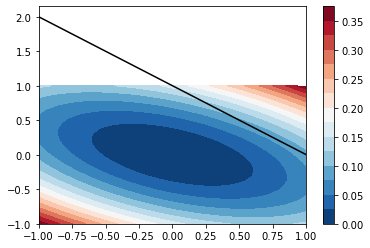

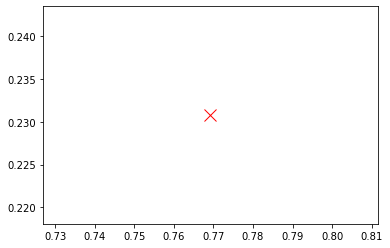

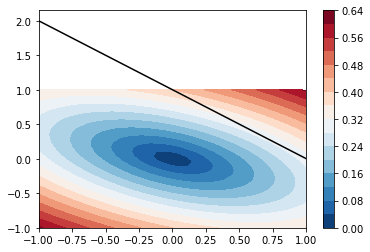

(-1.0, 1.0)

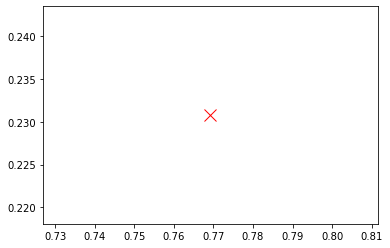

In [11]:
import numpy as np
from scipy.optimize import minimize, LinearConstraint, Bounds
import matplotlib.pyplot as plt

def min_var_obj(w, *args):
    
    
    sigma_1, sigma_2, rho = args
    w1 = w[0];
    w2 = w[1];
    
    obj = sigma_1**2*w1**2 + \
    sigma_2**2*w2**2 + \
    2*sigma_1*sigma_2*rho*w1*w2;
    return obj

def mesh_square(x0,y0,r,num):

# generate mesh using polar coordinates
 
    rr = np.linspace(-r,r,num)

    xx,yy = np.meshgrid(rr,rr);
 
    xx = xx + x0; 
    yy = yy + y0;

    return xx, yy

#%% optimization

sigma_1 = 0.3;
sigma_2 = 0.4;
rho = 0.5;

x0 = [0,0]; # initial guess
linear_constraint = LinearConstraint([1,1],[1],[1])

bounds = Bounds([-1, -1], [1.5, 1.5])

# Pass in a tuple with the wanted arguments a, b, c
res = minimize(min_var_obj, x0,
               args=(sigma_1,sigma_2,rho),
               method='trust-constr',
               bounds = bounds,
               constraints=[linear_constraint])
optimized_x = res.x;

print("==== Optimized weights ====")
print(res.x)

print("==== Optimized objective ====")
print(res.fun)

#%% Visualize contourf of portfolio variance and volatility

x0  = 0;  # center of the mesh
y0  = 0;  # center of the mesh
r   = 1;  # radius of the mesh
num = 30; # number of mesh grids
xx,yy = mesh_square(x0,y0,r,num); # generate mesh

plt.close('all')


zz = sigma_1**2*np.multiply(xx,xx) + \
    sigma_2**2*np.multiply(yy,yy) + \
    2*sigma_1*sigma_2*rho*np.multiply(xx,yy);

w1 = np.linspace(-1,1,10)
w2 = 1.0 - w1; 

var = sigma_1**2*np.multiply(w1,w1) + \
    sigma_2**2*np.multiply(w2,w2) + \
    2*sigma_1*sigma_2*rho*np.multiply(w1,w2);


fig, ax = plt.subplots()

cntr2 = ax.contourf(xx,yy,zz, levels = 15, cmap="RdBu_r")
plt.plot(w1,w2,'k',linewidth = 1.5)
fig.colorbar(cntr2, ax=ax)
plt.show()
plt.plot(optimized_x[0],optimized_x[1], 'rx', markersize = 12)

ax.set_xlabel('$\it{w}_1$')
ax.set_ylabel('$\it{w}_2$')
ax.axis('square')
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
ax.set_xlim([-r,r])
ax.set_ylim([-r,r])

fig, ax = plt.subplots()

cntr2 = ax.contourf(xx,yy,np.sqrt(zz), levels = 15, cmap="RdBu_r")
plt.plot(w1,w2,'k',linewidth = 1.5)
fig.colorbar(cntr2, ax=ax)
plt.show()
plt.plot(optimized_x[0],optimized_x[1], 'rx', markersize = 12)

ax.set_xlabel('$\it{w}_1$')
ax.set_ylabel('$\it{w}_2$')
ax.axis('square')
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
ax.set_xlim([-r,r])
ax.set_ylim([-r,r])


多目標式最佳化，一般多個目標會conflict，會得一系列最佳解set of Pareto optimal，本此有兩目標  
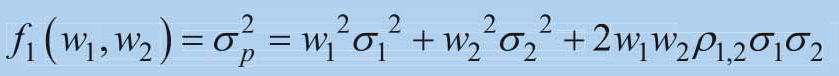  
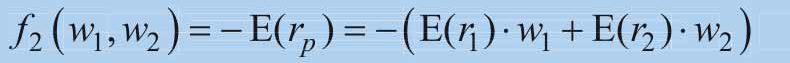  
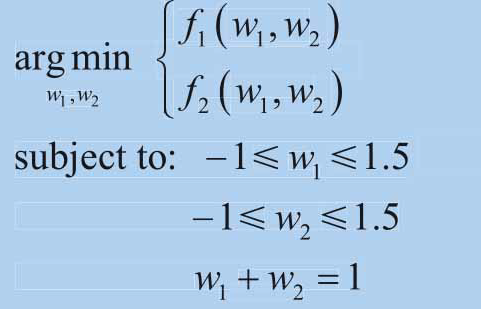  
兩目標解集圖為  
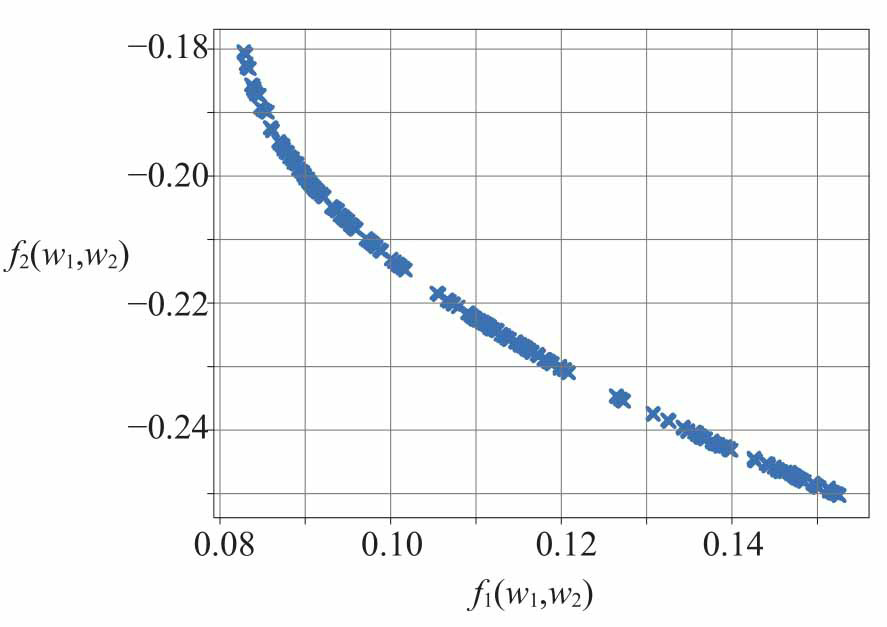  
變異與報酬之關係(efficient frontier)  
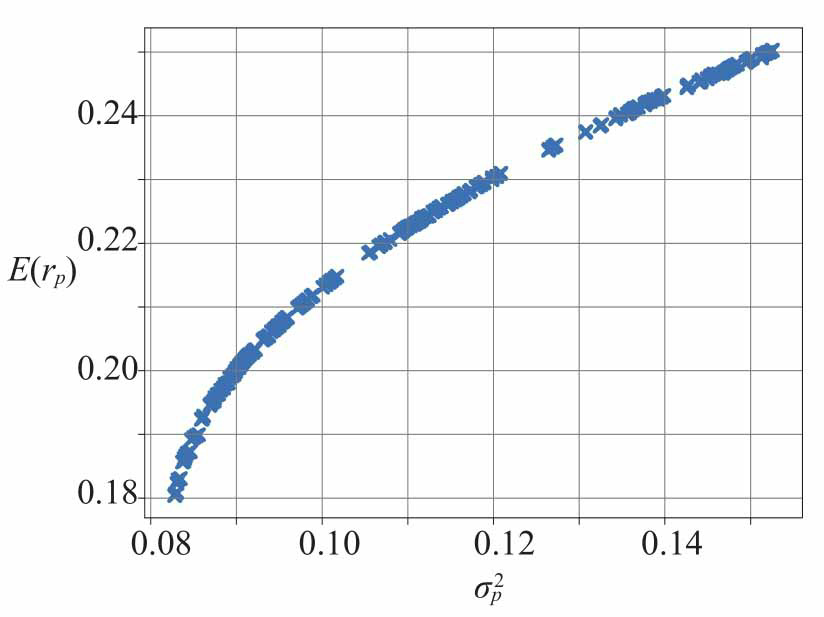


n_gen |  n_eval |   cv (min)   |   cv (avg)   |  n_nds  |     eps      |  indicator  
    1 |     200 |  0.000011449 |  1.367501586 |       1 |            - |            -
    2 |     400 |  0.00000E+00 |  0.136493557 |       1 |  0.063835885 |        ideal
    3 |     600 |  0.00000E+00 |  0.024423522 |       1 |  0.00000E+00 |            f
    4 |     800 |  0.00000E+00 |  0.006395665 |       2 |  1.000000000 |        ideal
    5 |    1000 |  0.00000E+00 |  0.002750355 |       2 |  0.00000E+00 |            f
    6 |    1200 |  0.00000E+00 |  0.001259619 |       2 |  0.00000E+00 |            f
    7 |    1400 |  0.00000E+00 |  0.000758744 |       4 |  0.360842528 |        ideal
    8 |    1600 |  0.00000E+00 |  0.000488252 |       7 |  0.171771687 |        ideal
    9 |    1800 |  0.00000E+00 |  0.000337526 |       8 |  0.006020450 |        ideal
   10 |    2000 |  0.00000E+00 |  0.000229821 |       9 |  0.278739155 |        ideal
   11 |    2200 |  0.00000E+00 |  0.000164952 |      1

   95 |   19000 |  0.00000E+00 |  0.00000E+00 |     200 |  0.000042839 |            f
   96 |   19200 |  0.00000E+00 |  0.00000E+00 |     200 |  0.000082587 |            f
   97 |   19400 |  0.00000E+00 |  0.00000E+00 |     200 |  0.000070599 |            f
   98 |   19600 |  0.00000E+00 |  0.00000E+00 |     200 |  0.000045439 |            f
   99 |   19800 |  0.00000E+00 |  0.00000E+00 |     200 |  0.000054999 |            f
  100 |   20000 |  0.00000E+00 |  0.00000E+00 |     200 |  0.000063650 |            f


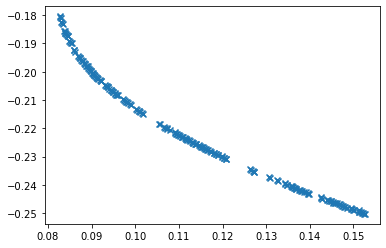

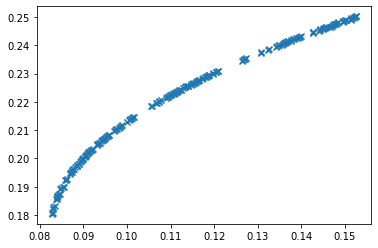

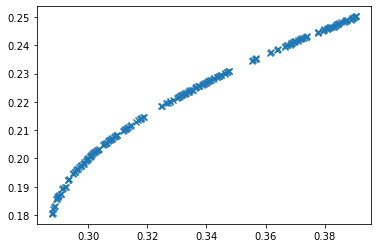

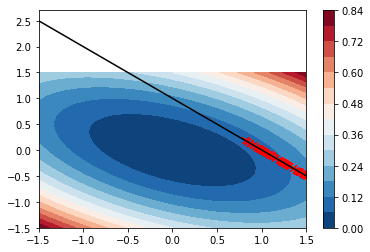

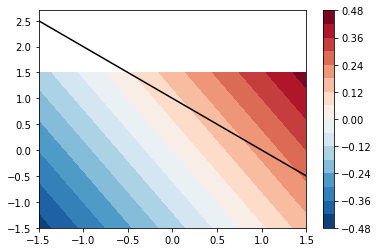

(-1.5, 1.5)

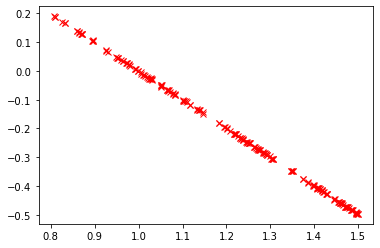

In [21]:
import numpy as np

from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter
import matplotlib.pyplot as plt

def mesh_square(x0,y0,r,num):

# generate mesh using polar coordinates
 
    rr = np.linspace(-r,r,num)

    xx,yy = np.meshgrid(rr,rr);
 
    xx = xx + x0; 
    yy = yy + y0;

    return xx, yy

class MyProblem(Problem):

    def __init__(self):
        super().__init__(n_var=2,#變數
                         n_obj=2,#目標
                         n_constr=1,
                         xl=np.array([-1, -1]),#lower
                         xu=np.array([1.5, 1.5]))#higher

    def _evaluate(self, x, out, *args, **kwargs):
        
        
        sigma_1 = 0.3;#
        sigma_2 = 0.4;
        rho = 0.5;
        Er1 = 0.2;
        Er2 = 0.1;
        f1 = (sigma_1**2*x[:, 0] ** 2 + 
              sigma_2**2*x[:, 1] ** 2 + 
              2*sigma_1*sigma_2*rho*x[:, 0]*x[:, 1])
        
        f2 = -(Er1*x[:, 0] + Er2*x[:, 1])
        g1 = (x[:, 0] + x[:, 1] - 1) ** 2 - 1e-5

        out["F"] = np.column_stack([f1, f2])
        out["G"] = g1
        

problem = MyProblem()
algorithm = NSGA2(pop_size=200)#多目標算法
#https://github.com/wurmen/Genetic-Algorithm-for-Job-Shop-Scheduling-and-NSGA-II/blob/master/introduction/NSGA-II/NSGA-II.md 類似genetic

res = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

results = res.F
opt_weights = res.X
opt_variance = results[:,0]
opt_Erp = -results[:,1]

#%% visualization of Pareto front and efficient frontier

plt.close('all')

fig, ax = plt.subplots()

plt.scatter(results[:,0],results[:,1],marker = 'x')
plt.show()

ax.set_xlabel("$\it{f}_1$")
ax.set_ylabel("$\it{f}_2$")

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

fig, ax = plt.subplots()

plt.scatter(opt_variance, opt_Erp,marker = 'x')
plt.show()

ax.set_xlabel("$\it{\sigma}_p^2$")
ax.set_ylabel("$\it{E(r_p)}$")

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

fig, ax = plt.subplots()

plt.scatter(np.sqrt(opt_variance), opt_Erp, marker = 'x')
plt.show()

ax.set_xlabel("$\it{\sigma}_p$")
ax.set_ylabel("$\it{E(r_p)}$")

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

#%% confourf of portfolio variance

x0  = 0;  # center of the mesh
y0  = 0;  # center of the mesh
r   = 1.5;  # radius of the mesh
num = 30; # number of mesh grids
xx,yy = mesh_square(x0,y0,r,num); # generate mesh

sigma_1 = 0.3;
sigma_2 = 0.4;
rho = 0.5;
Er1 = 0.2;
Er2 = 0.1;

zz = sigma_1**2*np.multiply(xx,xx) + \
    sigma_2**2*np.multiply(yy,yy) + \
    2*sigma_1*sigma_2*rho*np.multiply(xx,yy);

w1 = np.linspace(-1.5,1.5,10)
w2 = 1.0 - w1; 

var = sigma_1**2*np.multiply(w1,w1) + \
    sigma_2**2*np.multiply(w2,w2) + \
    2*sigma_1*sigma_2*rho*np.multiply(w1,w2);


fig, ax = plt.subplots()

cntr2 = ax.contourf(xx,yy,zz, levels = 15, cmap="RdBu_r")
plt.plot(opt_weights[:,0],opt_weights[:,1],linestyle = 'none', marker = 'x', color = 'r')
plt.plot(w1,w2,'k',linewidth = 1.5)
fig.colorbar(cntr2, ax=ax)
plt.show()

ax.set_xlabel('$\it{w}_1$')
ax.set_ylabel('$\it{w}_2$')
ax.axis('square')
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
ax.set_xlim([-r,r])
ax.set_ylim([-r,r])

#%% confourf of portfolio expected return

Erp = 0.2*w1 + 0.1*w2;

zz = 0.2*xx + 0.1*yy;

fig, ax = plt.subplots()

cntr2 = ax.contourf(xx,yy,zz, levels = 15, cmap="RdBu_r")
plt.plot(w1,w2,'k',linewidth = 1.5)
fig.colorbar(cntr2, ax=ax)
plt.show()
plt.plot(opt_weights[:,0],opt_weights[:,1],linestyle = 'none', marker = 'x', color = 'r')

ax.set_xlabel('$\it{w}_1$')
ax.set_ylabel('$\it{w}_2$')
ax.axis('square')
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
ax.set_xlim([-r,r])
ax.set_ylim([-r,r])
